# Data Loading and Pre-Processing

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install -r '/content/drive/MyDrive/DS Project/requirements.txt'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 4.6 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of dice-ml to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 149.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.9/253.9 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 6.4 MB/s eta 0:00:00
   ━

In [ ]:
import pandas as pd

# Load data
data = pd.read_csv('../data/Hospital_Inpatient_Discharges__SPARCS_De-Identified___2022_20250423.csv')
data.head()

/tmp/ipython-input-2-2938787827.py:4: DtypeWarning: Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('/content/drive/MyDrive/DS Project/Hospital_Inpatient_Discharges__SPARCS_De-Identified___2022_20250423.csv')


,Hospital Service Area,Hospital County,Operating Certificate Number,Permanent Facility Id,Facility Name,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,...,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Payment Typology 2,Payment Typology 3,Birth Weight,Emergency Department Indicator,Total Charges,Total Costs
0,New York City,Bronx,7000006.0,3058.0,Montefiore Med Center - Jack D Weiler Hosp of ...,50 to 69,107,F,White,Not Span/Hispanic,...,Major,Major,Medical,Medicaid,NaN,NaN,NaN,Y,"51,514.62","7,552.54"
1,New York City,Bronx,7000006.0,3058.0,Montefiore Med Center - Jack D Weiler Hosp of ...,18 to 29,104,M,Black/African American,Spanish/Hispanic,...,Moderate,Minor,Medical,Medicaid,NaN,NaN,NaN,Y,"25,370.86","3,469.55"
2,New York City,Bronx,7000006.0,3058.0,Montefiore Med Center - Jack D Weiler Hosp of ...,18 to 29,104,F,Other Race,Spanish/Hispanic,...,Minor,Minor,Medical,Medicaid,NaN,NaN,NaN,N,"23,876.78","6,180.33"
3,New York City,Bronx,7000006.0,3058.0,Montefiore Med Center - Jack D Weiler Hosp of ...,18 to 29,100,F,Black/African American,Not Span/Hispanic,...,Moderate,Minor,Medical,Medicaid,NaN,NaN,NaN,Y,"43,319.05","12,588.93"
4,New York City,Bronx,7000006.0,1168.0,Montefiore Medical Center-Wakefield Hospital,18 to 29,104,M,Other Race,Spanish/Hispanic,...,Moderate,Moderate,Medical,Medicaid,NaN,NaN,NaN,Y,"40,266.23","10,355.99"


In [ ]:
import json

with open("../data/data_info.json", "r") as f:
    data_info = json.load(f)

In [4]:
for col in data.columns:
    if data[col].isna().any():
        print(col, data[col].isna().sum())

Hospital Service Area 5390
Hospital County 5390
Operating Certificate Number 5961
Permanent Facility Id 5390
Zip Code - 3 digits 41227
CCSR Procedure Code 582815
CCSR Procedure Description 582815
APR Severity of Illness Description 636
APR Risk of Mortality 636
Payment Typology 2 1121497
Payment Typology 3 1814362
Birth Weight 1894796


In [5]:
# Handle missing data and changing column type
for col_name, info in data_info.items():
    print(col_name)
    if info["type"] == "int64":
        if col_name == "Zip Code - 3 digits":
            data[col_name] = data[col_name].replace("OOS", 000)
            data[col_name] = data[col_name].fillna(000)
        if col_name == "Length of Stay":
            data[col_name] = data[col_name].replace("120 +", 121)
        if col_name == "Birth Weight":
            data[col_name] = data[col_name].replace("UNKN", -1)
            data[col_name] = data[col_name].fillna(-1)
        else:
            data[col_name] = data[col_name].fillna(-1)

        data[col_name] = pd.to_numeric(data[col_name]).astype('int')

    elif info["type"] == "str":
        data[col_name] = data[col_name].fillna("Unknown")
        data[col_name] = data[col_name].astype(str)

    elif info["type"] == "float64":
        data[col_name] = data[col_name].str.replace(',', '')
        data[col_name] = pd.to_numeric(data[col_name]).astype('float')


Hospital Service Area
Hospital County
Operating Certificate Number
Permanent Facility Id
Facility Name
Age Group
Zip Code - 3 digits
Gender
Race
Ethnicity
Length of Stay
Type of Admission
Patient Disposition
Discharge Year
CCSR Diagnosis Code
CCSR Diagnosis Description
CCSR Procedure Code
CCSR Procedure Description
APR DRG Code
APR DRG Description
APR MDC Code
APR MDC Description
APR Severity of Illness Code
APR Severity of Illness Description
APR Risk of Mortality
APR Medical Surgical Description
Payment Typology 1
Payment Typology 2
Payment Typology 3
Birth Weight
Emergency Department Indicator
Total Charges
Total Costs


In [6]:
for col in data.columns:
    if data[col].isna().any():
        print(col, data[col].isna().sum())

In [7]:
for col in data.columns:
    print(col, data[col].dtype)

Hospital Service Area object
Hospital County object
Operating Certificate Number int64
Permanent Facility Id int64
Facility Name object
Age Group object
Zip Code - 3 digits int64
Gender object
Race object
Ethnicity object
Length of Stay int64
Type of Admission object
Patient Disposition object
Discharge Year int64
CCSR Diagnosis Code object
CCSR Diagnosis Description object
CCSR Procedure Code object
CCSR Procedure Description object
APR DRG Code int64
APR DRG Description object
APR MDC Code int64
APR MDC Description object
APR Severity of Illness Code object
APR Severity of Illness Description object
APR Risk of Mortality object
APR Medical Surgical Description object
Payment Typology 1 object
Payment Typology 2 object
Payment Typology 3 object
Birth Weight int64
Emergency Department Indicator object
Total Charges float64
Total Costs float64


In [8]:
categorical_columns = []
for col in data.columns:
    print(col, data[col].dtype)
    if data[col].dtype == 'object':
        data[col] = data[col].astype('category')
        categorical_columns.append(col)
print(categorical_columns)

Hospital Service Area object
Hospital County object
Operating Certificate Number int64
Permanent Facility Id int64
Facility Name object
Age Group object
Zip Code - 3 digits int64
Gender object
Race object
Ethnicity object
Length of Stay int64
Type of Admission object
Patient Disposition object
Discharge Year int64
CCSR Diagnosis Code object
CCSR Diagnosis Description object
CCSR Procedure Code object
CCSR Procedure Description object
APR DRG Code int64
APR DRG Description object
APR MDC Code int64
APR MDC Description object
APR Severity of Illness Code object
APR Severity of Illness Description object
APR Risk of Mortality object
APR Medical Surgical Description object
Payment Typology 1 object
Payment Typology 2 object
Payment Typology 3 object
Birth Weight int64
Emergency Department Indicator object
Total Charges float64
Total Costs float64
['Hospital Service Area', 'Hospital County', 'Facility Name', 'Age Group', 'Gender', 'Race', 'Ethnicity', 'Type of Admission', 'Patient Dispositi

In [9]:
X = data.drop(columns=['Total Costs', ])
y = data['Total Costs']

In [10]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_train.to_csv('../XAIData/preprocessed_X_train.csv', index=False)
y_train.to_csv('../XAIData/preprocessed_y_train.csv', index=False)
X_test.to_csv('../XAIData/preprocessed_X_test.csv', index=False)
y_test.to_csv('../XAIData/preprocessed_y_test.csv', index=False)

In [ ]:
full_df = pd.concat([X_train, X_test])
full_df['Total Costs'] = pd.concat([y_train, y_test]).values
full_df.to_csv('../XAIData/preprocessed_full_data.csv', index=False)

In [ ]:
# Save categorical columns metadata
with open('../XAIData/categorical_columns.txt', 'w') as f:
    f.write(','.join(categorical_columns))

In [ ]:
#Save category mappings for each column (important!)
for col in categorical_columns:
    cat_map = dict(enumerate(X_train[col].cat.categories))
    with open(f'../XAIData/category_mapping_{col}.txt', 'w') as f:
        for code, category in cat_map.items():
            f.write(f"{code},{category}\n")

print("Data saved successfully!")
print(f"Detected categorical columns: {categorical_columns}")

Data saved successfully!
Detected categorical columns: ['Hospital Service Area', 'Hospital County', 'Facility Name', 'Age Group', 'Gender', 'Race', 'Ethnicity', 'Type of Admission', 'Patient Disposition', 'CCSR Diagnosis Code', 'CCSR Diagnosis Description', 'CCSR Procedure Code', 'CCSR Procedure Description', 'APR DRG Description', 'APR MDC Description', 'APR Severity of Illness Code', 'APR Severity of Illness Description', 'APR Risk of Mortality', 'APR Medical Surgical Description', 'Payment Typology 1', 'Payment Typology 2', 'Payment Typology 3', 'Emergency Department Indicator']


In [15]:
!pip install dice_ml
!pip install xgboost
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import dice_ml
from dice_ml import Dice
import joblib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 59.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 192.6 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 1.5.3 which is incompatible.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.9/253.9 MB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.3/322.3 MB 11.8 MB/s eta 0:00:00


In [ ]:
!git clone https://github.com/yandex-research/tabm
!pip install rtdl_num_embeddings

fatal: destination path 'tabm' already exists and is not an empty directory.


# Counterfactuals for LightGBM and XGBoost

In [ ]:
!pip install LightGBM
!pip install joblib
import os
import math
import numpy as np
import pandas as pd
import joblib
from sklearn.base import BaseEstimator, RegressorMixin
import dice_ml


target_col = 'Total Costs'
model_paths = {
    'LightGBM': '../models/lgb_model.pkl',
    'XGBoost': '../models/xgb_model.pkl',
}


cf_target = [3000, 9000]

X_train_path = '../XAIData/preprocessed_X_train.csv'
X_test_path  = '../XAIData/preprocessed_X_test.csv'
y_train_path = '../XAIData/preprocessed_Y_train.csv'
y_test_path  = '../XAIData/preprocessed_Y_test.csv'

mappings_dir  = '../XAIData/'

def enforce_category_dtype(df, categorical_columns, category_mappings):
    for col in categorical_columns:
        if col in df.columns and col in category_mappings:
            cat_dtype = pd.CategoricalDtype(categories=category_mappings[col], ordered=False)
            df[col] = df[col].astype(str).astype(cat_dtype)
    return df


X_train = pd.read_csv(X_train_path)
X_test  = pd.read_csv(X_test_path)

y_train = pd.read_csv(y_train_path, header=None, names=[target_col], dtype=float, skiprows=1)
y_test  = pd.read_csv(y_test_path, header=None, names=[target_col], dtype=float, skiprows=1)

# Create combined dataset for DiCE.
full_df = pd.concat([X_train.reset_index(drop=True), X_test.reset_index(drop=True)], ignore_index=True)
full_df[target_col] = pd.concat([y_train.reset_index(drop=True), y_test.reset_index(drop=True)], ignore_index=True)[target_col]

categorical_columns = []
category_mappings = {}

mapping_files = [f for f in os.listdir(mappings_dir)
                 if f.startswith('category_mapping_') and f.endswith('.txt')]
for file in mapping_files:
    col_name = file.replace('category_mapping_', '').replace('.txt', '')
    if col_name:
        categorical_columns.append(col_name)
        mapping = {}
        categories = []
        with open(os.path.join(mappings_dir, file), 'r') as f:
            for line in f:
                parts = line.strip().split(',', 1)
                if len(parts) == 2:
                    code, category = parts
                    try:
                        mapping[int(code)] = category
                        categories.append(category)
                    except ValueError:
                        print(f"Skipping invalid code in {file}: {code}")
        if mapping:
            sorted_categories = [mapping[k] for k in sorted(mapping.keys())]
            category_mappings[col_name] = sorted_categories
            print(f"Loaded {len(sorted_categories)} categories for {col_name}")
        else:
            print(f"Warning: No valid mappings found for {col_name}")

print("\nValid categorical features:", [col for col in categorical_columns if col in category_mappings])

# Identify continuous features.
continuous_features = [col for col in X_train.columns if col not in categorical_columns]
print("Continuous features:", continuous_features)

# Enforce categorical dtypes for consistency.
X_train = enforce_category_dtype(X_train, categorical_columns, category_mappings)
X_test  = enforce_category_dtype(X_test, categorical_columns, category_mappings)
full_df  = enforce_category_dtype(full_df, categorical_columns, category_mappings)




dice_data = dice_ml.Data(
    dataframe=full_df,
    continuous_features=continuous_features,
    categorical_features=[col for col in categorical_columns if col in category_mappings],
    outcome_name=target_col
)


class SklearnModelWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, model, category_mappings):
        self.model = model
        self.category_mappings = category_mappings
    def predict(self, X):
        X_converted = X.copy()
        for col in self.category_mappings:
            if col in X_converted.columns:
                cat_dtype = pd.CategoricalDtype(categories=self.category_mappings[col], ordered=False)
                X_converted[col] = X_converted[col].astype(str).astype(cat_dtype)
        return self.model.predict(X_converted)



models = {}
for name, path in model_paths.items():
    models[name] = ('sklearn', joblib.load(path))



# GENERATE COUNTERFACTUALS

results = []
n_counterfactuals = min(50, len(X_test))

# Prepare batch query data.
batch_query_data = X_test.iloc[:n_counterfactuals].copy()
batch_query_data = enforce_category_dtype(batch_query_data, categorical_columns, category_mappings)
orig_targets = y_test.iloc[:n_counterfactuals].values

# Save the input records used for generating counterfactuals to a CSV file.
batch_query_data.to_csv('../XAIData/counterfactual_input_records_50_batch.csv', index=False)
print("Saved input records for counterfactual generation to CSV.")

for model_name, (model_type, model_obj) in models.items():
    print(f"\n{'='*30}\nWorking on model: {model_name}\n{'='*30}")
    if model_type == 'sklearn':
        wrapped_model = SklearnModelWrapper(model_obj, category_mappings)
        dice_backend = "sklearn"
    elif model_type == 'tabm':
        wrapped_model = TabMWrapper(model_obj, category_mappings, device=tabm_device)
        dice_backend = "PYT"
    else:
        print(f"Unknown model type for {model_name}")
        continue
    try:
        preds = wrapped_model.predict(batch_query_data)
    except Exception as e:
        print(f"Batch prediction failed for model {model_name}: {e}")
        continue
    try:
        dice_model = dice_ml.Model(
            model=wrapped_model,
            backend=dice_backend,
            model_type='regressor'
        )
        dice_explainer = dice_ml.Dice(
            dice_data,
            dice_model,
            method="kdtree"
        )
    except Exception as e:
        print(f"Failed to initialize DiCE for model {model_name}: {e}")
        continue
    try:
        counterfactuals = dice_explainer.generate_counterfactuals(
            batch_query_data,
            total_CFs=3,
            desired_range=cf_target,
            proximity_weight=0.3,
            diversity_weight=0.5,
            categorical_penalty=0.05,
            verbose=False,
            posthoc_sparsity_param=0.1
        )
    except Exception as e:
        print(f"Counterfactual generation failed for model {model_name}: {e}")
        continue
    for idx, cf_example in enumerate(counterfactuals.cf_examples_list):
        try:
            cf_df = cf_example.final_cfs_df
            cf_df['model'] = [model_name] * len(cf_df)
            cf_df['original_index'] = [idx] * len(cf_df)
            cf_df['original_prediction'] = [preds[idx]] * len(cf_df)
            cf_df['actual_target'] = [orig_targets[idx]] * len(cf_df)
            results.append(cf_df)
        except Exception as e:
            print(f"Error processing counterfactuals for model {model_name} on record {idx}: {e}")

if results:
    all_cfs = pd.concat(results, ignore_index=True)
    for col in categorical_columns:
        if col in all_cfs.columns:
            all_cfs[col] = all_cfs[col].astype(str)
    all_cfs.to_csv('../XAIData/counterfactual_results_50_batch.csv', index=False)
    print("\nAll counterfactuals saved to counterfactual_results_50_batch.csv")
else:
    print("No counterfactuals generated for any model.")

print("\nBatch counterfactual generation for 50 records complete!")

  Using cached lightgbm-4.6.0-py3-none-manylinux_2_28_x86_64.whl.metadata (17 kB)
Using cached lightgbm-4.6.0-py3-none-manylinux_2_28_x86_64.whl (3.6 MB)
Loaded 4 categories for Ethnicity
Loaded 9 categories for Hospital Service Area
Loaded 3 categories for Gender
Loaded 6 categories for Type of Admission
Loaded 58 categories for Hospital County
Loaded 5 categories for Age Group
Loaded 4 categories for Race
Loaded 19 categories for Patient Disposition
Loaded 206 categories for Facility Name
Loaded 480 categories for CCSR Diagnosis Code
Loaded 322 categories for CCSR Procedure Code
Loaded 334 categories for APR DRG Description
Loaded 322 categories for CCSR Procedure Description
Loaded 480 categories for CCSR Diagnosis Description
Loaded 26 categories for APR MDC Description
Loaded 5 categories for APR Severity of Illness Code
Loaded 5 categories for APR Severity of Illness Description
Loaded 5 categories for APR Risk of Mortality
Loaded 3 categories for APR Medical Surgical Description

/usr/lib/python3.11/pickle.py:1718: UserWarning: [05:14:06] WARNING: /workspace/src/collective/../data/../common/error_msg.h:82: If you are loading a serialized model (like pickle in Python, RDS in R) or
configuration generated by an older version of XGBoost, please export the model by calling
`Booster.save_model` from that version first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/stable/tutorials/saving_model.html

for more details about differences between saving model and serializing.

  setstate(state)


Saved input records for counterfactual generation to CSV.

Working on model: LightGBM


100%|██████████| 1/1 [05:15<00:00, 315.47s/it]



Working on model: XGBoost


100%|██████████| 1/1 [04:40<00:00, 280.96s/it]



All counterfactuals saved to counterfactual_results_1_batch.csv

Batch counterfactual generation for 50 records complete!


# Metrics for Counterfactuals

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split

# --- CONFIG ---
n_models = 3
n_cf_per_model = 3
total_cf_per_input = n_models * n_cf_per_model
target_range = (3000, 9000)  # Define your desired output range

# --- LOAD ORIGINALS & COUNTERFACTUALS ---
originals = pd.read_csv("/content/drive/MyDrive/DS Project/LightGBM and XGBOOST Counterfactuals/counterfactual_input_records.csv")
counterfactuals = pd.read_csv("/content/drive/MyDrive/DS Project/LightGBM and XGBOOST Counterfactuals/counterfactual_results_50_batch.csv")

# --- DROP NON-NUMERIC COLUMNS ---
non_numeric_cols = originals.select_dtypes(include=['object']).columns
originals_clean = originals.drop(columns=non_numeric_cols)
counterfactuals_clean = counterfactuals.drop(columns=non_numeric_cols)

# --- ALIGN FEATURES ---
matching_cols = [col for col in originals_clean.columns if col in counterfactuals_clean.columns]
originals_array = originals_clean[matching_cols].apply(pd.to_numeric, errors='coerce').fillna(0).to_numpy(dtype=np.float32)
counterfactuals_array = counterfactuals_clean[matching_cols].apply(pd.to_numeric, errors='coerce').fillna(0).to_numpy(dtype=np.float32)

# --- SAMPLE TRAINING DATA FOR PLAUSIBILITY ---
X_train = originals_clean[matching_cols].apply(pd.to_numeric, errors='coerce').fillna(0).astype(np.float32)
y_dummy = np.random.uniform(3000, 9000, size=len(X_train))  # Dummy target values
X_train_split, _, y_train_split, _ = train_test_split(X_train, y_dummy, random_state=42)

# --- SAMPLE REGRESSION MODEL ---
model = RandomForestRegressor()
model.fit(X_train_split, y_train_split)

# --- METRICS ---
def compute_sparsity(orig, cf):
    return np.sum(orig != cf)

def validity_score(model, cf, target_range):
    pred = model.predict(cf.reshape(1, -1))[0]
    return target_range[0] <= pred <= target_range[1]

def plausibility_score(cf, train_data, k=5):
    nn = NearestNeighbors(n_neighbors=k)
    nn.fit(train_data)
    distances, _ = nn.kneighbors(cf.reshape(1, -1))
    return np.mean(distances)

# --- EVALUATE ---
results = []
for i in range(len(originals_array)):
    orig = originals_array[i]
    for j in range(total_cf_per_input):
        idx = i * total_cf_per_input + j
        if idx >= len(counterfactuals_array):
            break
        cf = counterfactuals_array[idx]
        sparsity = compute_sparsity(orig, cf)
        validity = validity_score(model, cf, target_range)
        plausibility = plausibility_score(cf, X_train_split)
        results.append({
            "original_index": i,
            "model_id": j // n_cf_per_model,
            "cf_number": (j % n_cf_per_model) + 1,
            "sparsity": sparsity,
            "validity": validity,
            "plausibility": plausibility
        })

# --- SAVE RESULTS ---
df_results = pd.DataFrame(results)
df_results.to_csv("/content/drive/MyDrive/DS Project/counterfactual_evaluation_metrics.csv", index=False)
print("Saved evaluation results to counterfactual_evaluation_metrics.csv")

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11

Saved evaluation results to counterfactual_evaluation_metrics.csv


# Change in Total Cost for Counterfactual Output

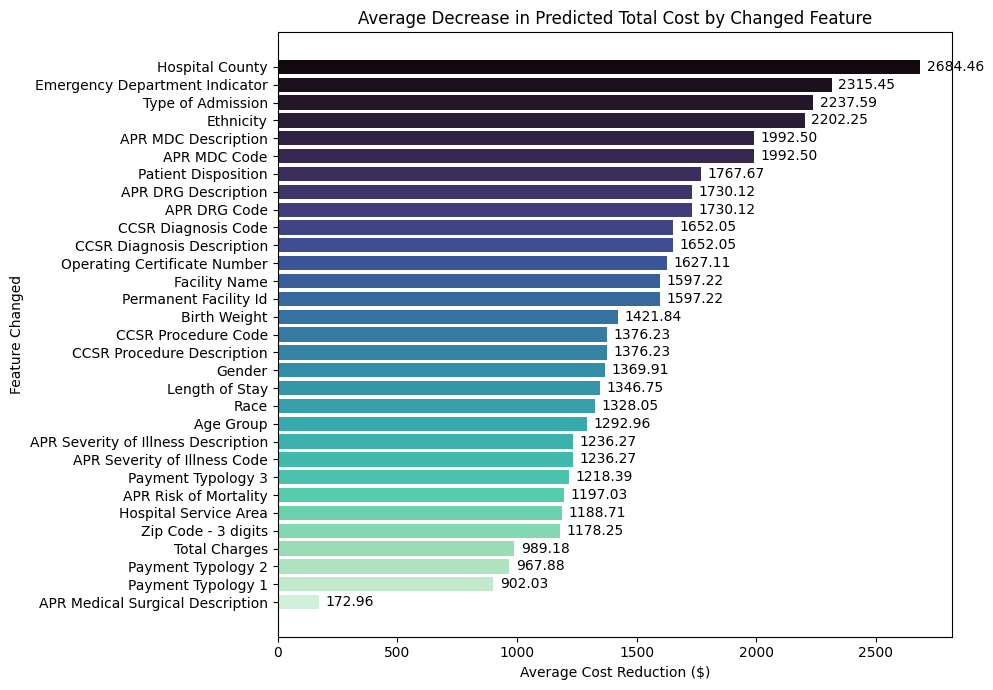

In [ ]:
#For full data frame
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load main results (predictions + counterfactual feature cols)
df_main = pd.read_csv(
    '../XAIData/'
    'counterfactual_results_50_batch.csv'
)

# 2. Load original input records
df_input = pd.read_csv(
    '../XAIData/'
    'counterfactual_input_records.csv'
)

# 3. Identify overlapping feature names
common_feats = list(set(df_input.columns) & set(df_main.columns))

# 4. Rename input feats → suffix _orig; main feats → suffix _cf
df_input_orig = df_input.rename(columns={f: f + '_orig' for f in common_feats})
df_main_cf   = df_main.rename(columns={f: f + '_cf'   for f in common_feats})

# 5. Parse counterfactual & original predictions, compute cost_delta
df_main_cf['counterfactual_prediction'] = (
    df_main_cf['actual_target']
      .astype(str)
      .str.extract(r'\[([0-9.]+)\]')
      .astype(float)
)
df_main_cf['original_prediction'] = df_main_cf['original_prediction'].astype(float)
df_main_cf['cost_delta'] = (
    df_main_cf['original_prediction']
    - df_main_cf['counterfactual_prediction']
)

# 6. Align & merge original features into the main DataFrame
#    Assuming df_main has a column 'original_index' matching df_input row index
orig_idx = df_main_cf['original_index'].values
df_orig_aligned = df_input_orig.loc[orig_idx].reset_index(drop=True)
df = pd.concat([df_main_cf.reset_index(drop=True), df_orig_aligned], axis=1)

# 7. Compute changed features per row
feature_names = common_feats
def get_changed(row):
    out = []
    for feat in feature_names:
        o = row[f'{feat}_orig']
        c = row[f'{feat}_cf']
        if pd.isna(o) and pd.isna(c):
            continue
        if o != c:
            out.append(feat)
    return out

df['features_changed'] = df.apply(get_changed, axis=1)

# 8. Explode & aggregate mean cost_delta by feature
df_expl = df.explode('features_changed')
impact = (
    df_expl
      .groupby('features_changed')['cost_delta']
      .mean()
      .reset_index()
      .sort_values('cost_delta', ascending=False)
      .reset_index(drop=True)
)

# 9. Plot horizontal bar chart
plt.figure(figsize=(10, 7))
colors = sns.color_palette('mako', n_colors=len(impact))

plt.barh(impact['features_changed'], impact['cost_delta'], color=colors)
plt.gca().invert_yaxis()
plt.title('Average Decrease in Predicted Total Cost by Changed Feature')
plt.xlabel('Average Cost Reduction ($)')
plt.ylabel('Feature Changed')

maxv = impact['cost_delta'].max()
for i, v in enumerate(impact['cost_delta']):
    plt.text(v + maxv*0.01, i, f"{v:.2f}", va='center')

plt.tight_layout()
plt.show()

# SHAP Plots for LightGBM

In [ ]:
!pip install LightGBM
!pip install shap
import joblib

model = joblib.load("../models/lgb_model.pkl")

  Using cached lightgbm-4.6.0-py3-none-manylinux_2_28_x86_64.whl.metadata (17 kB)
Using cached lightgbm-4.6.0-py3-none-manylinux_2_28_x86_64.whl (3.6 MB)
  Using cached shap-0.48.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (25 kB)
Using cached shap-0.48.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.0 MB)


In [ ]:
import shap

# Explain model predictions using SHAP
explainer = shap.Explainer(model)

In [ ]:
# Save explainer to a file
joblib.dump(explainer, '../models/shap_explainer.pkl')

# Later: load it back
explainer = joblib.load('../models/shap_explainer.pkl')

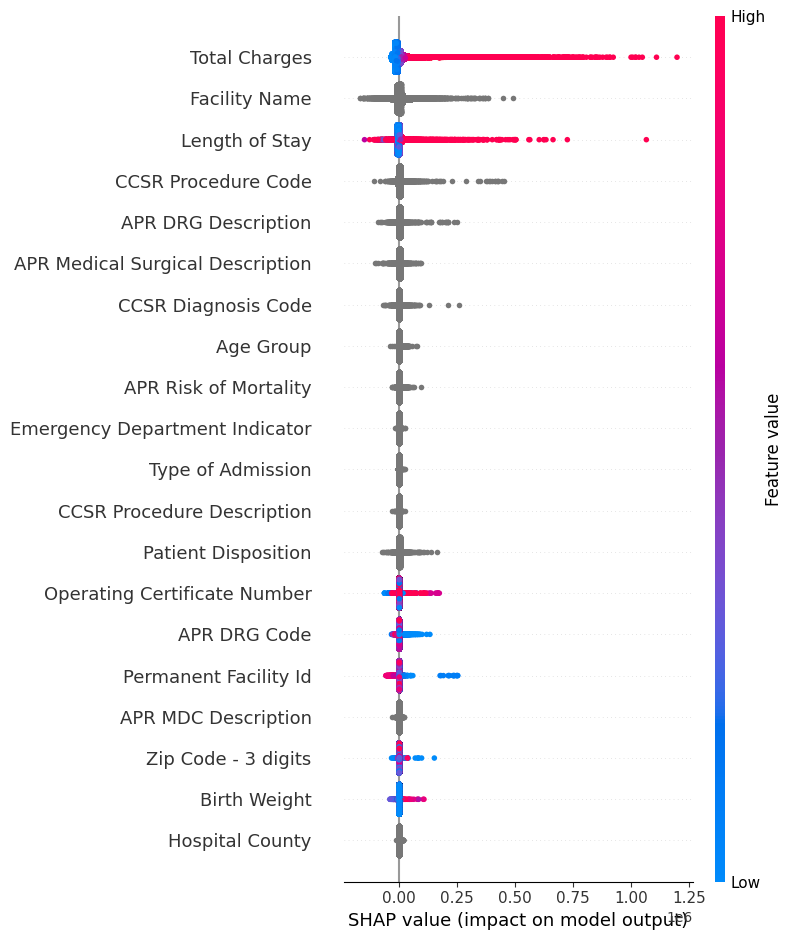

In [ ]:

# Visualize feature importance
shap_values = explainer(X_test)
shap.summary_plot(shap_values, X_test)

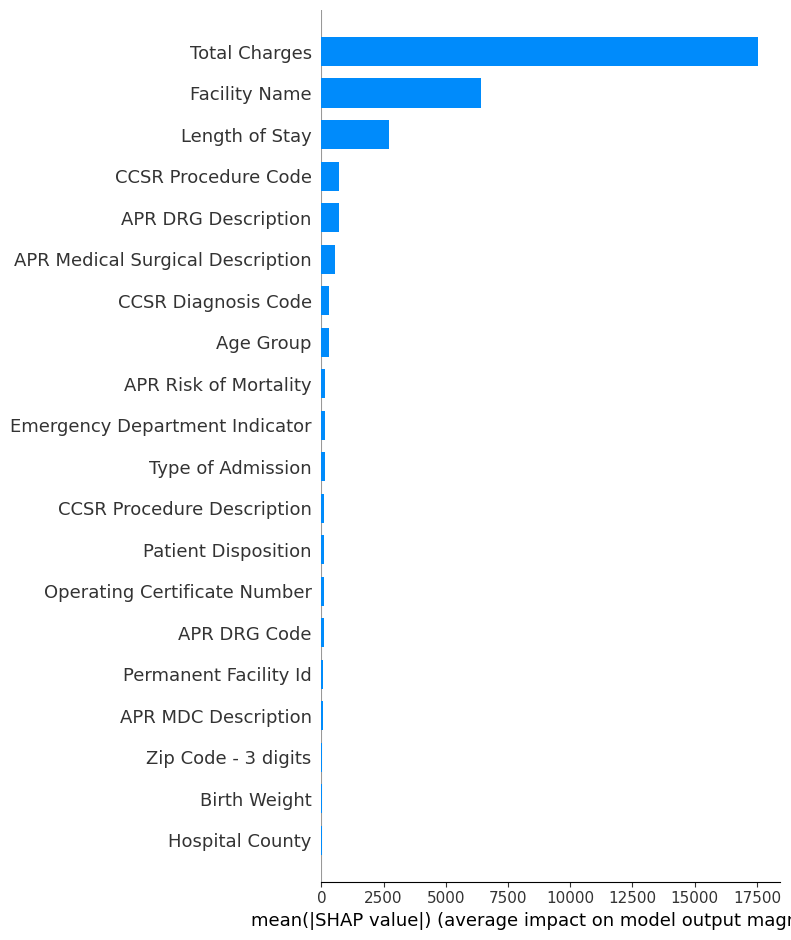

In [ ]:
features = X_test.columns.tolist()
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names=features, plot_type="bar")

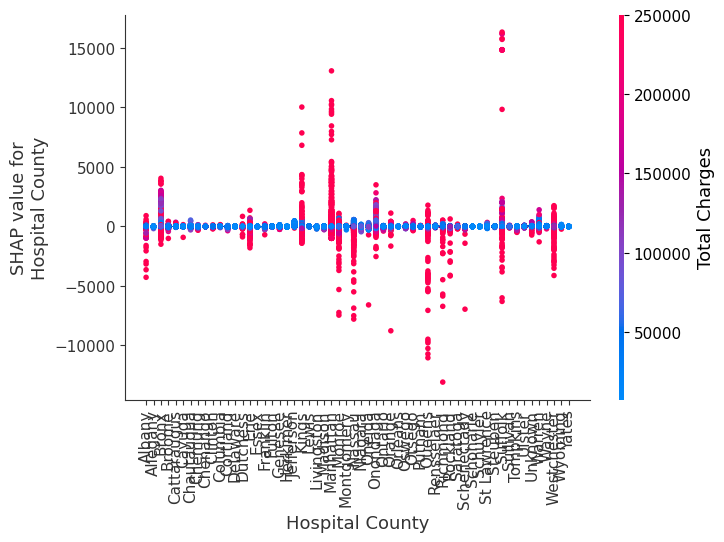

In [ ]:
feature_index = 1
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

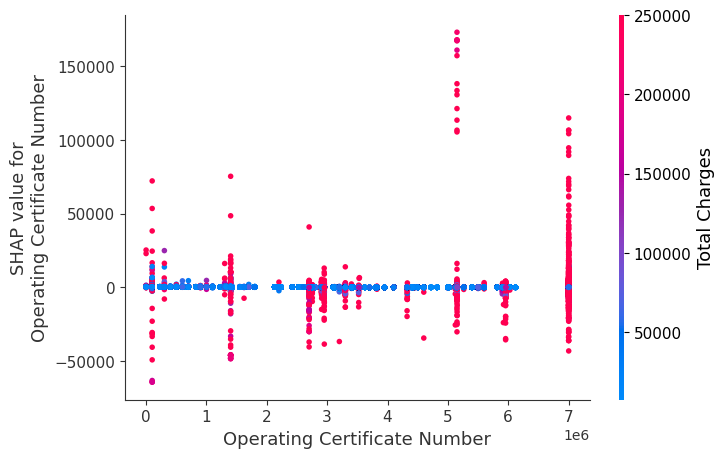

In [ ]:
feature_index = 2
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

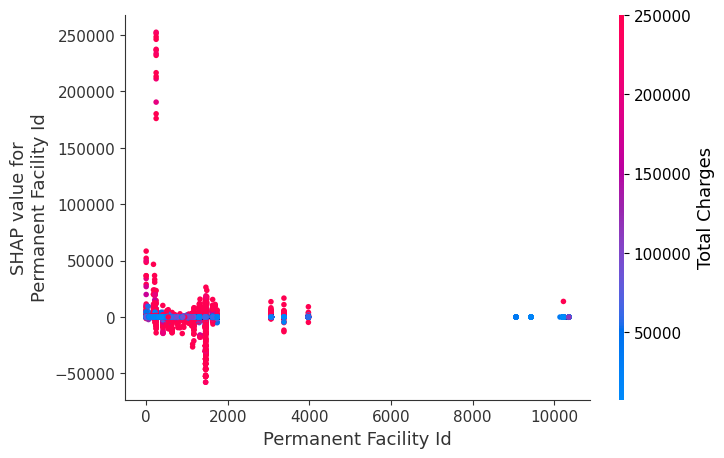

In [ ]:
feature_index = 3
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

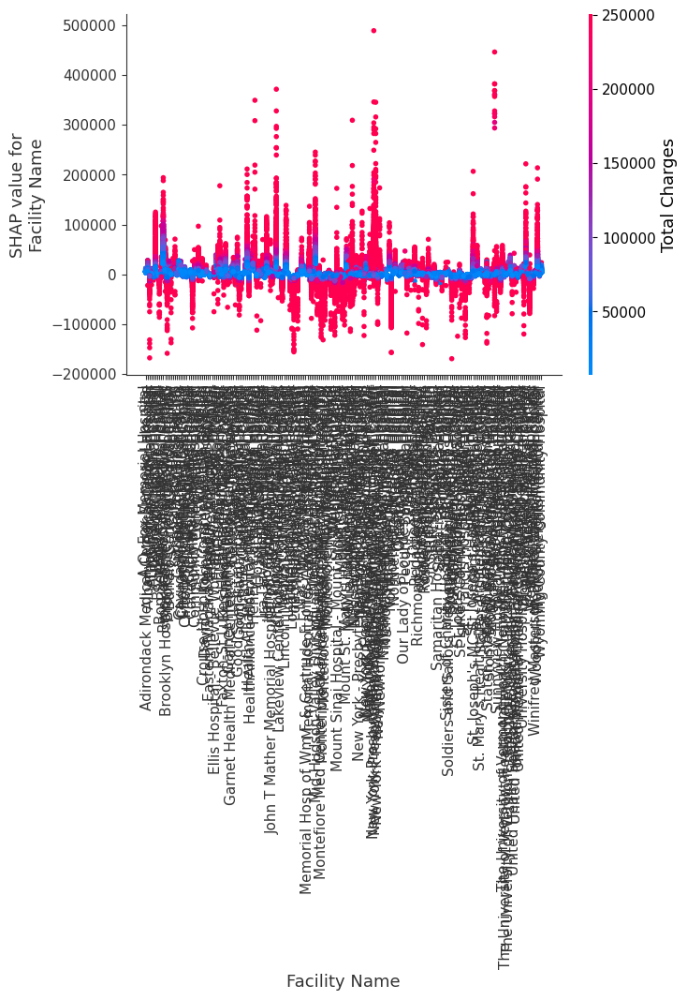

In [ ]:
feature_index = 4
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

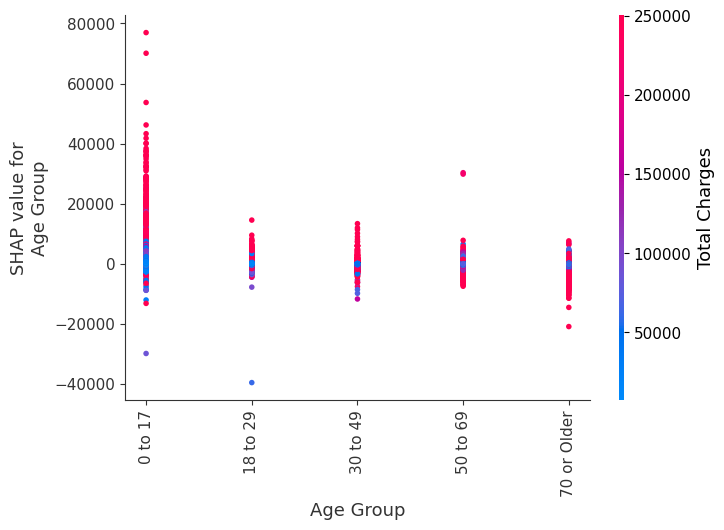

In [ ]:
feature_index = 5
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

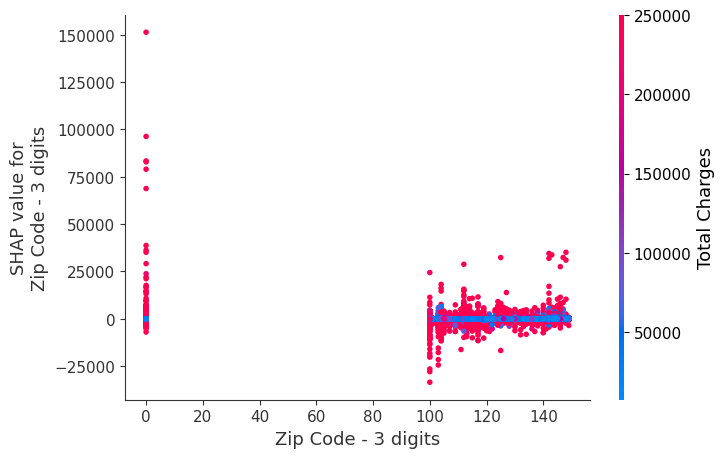

In [ ]:
feature_index = 6
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

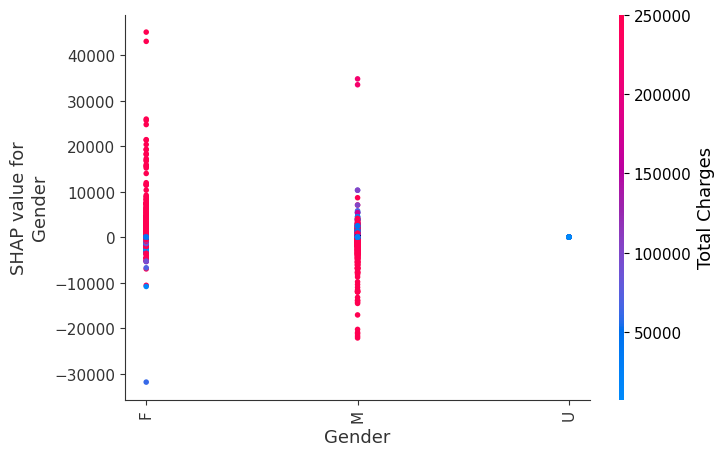

In [ ]:
feature_index = 7
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

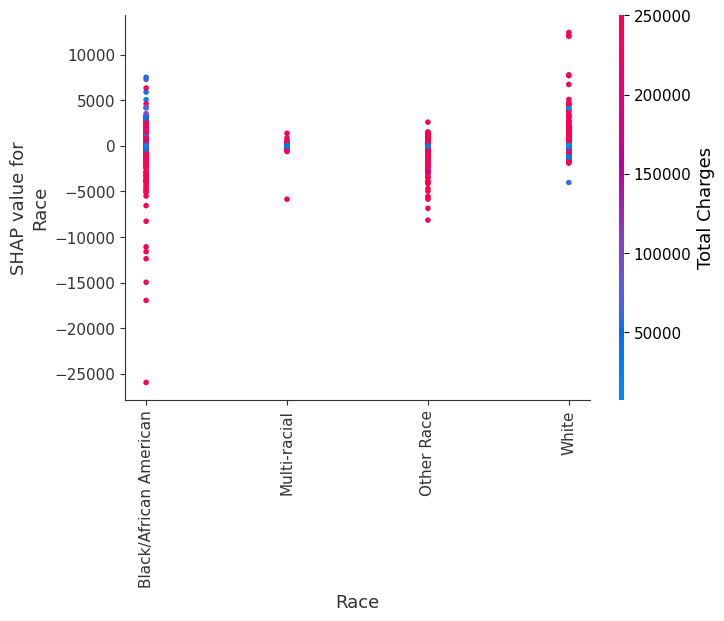

In [ ]:
feature_index = 8
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

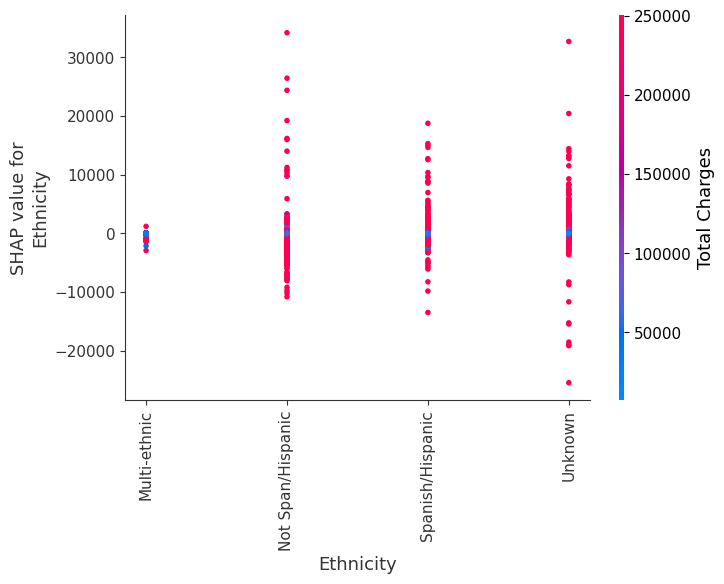

In [ ]:
feature_index = 9
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

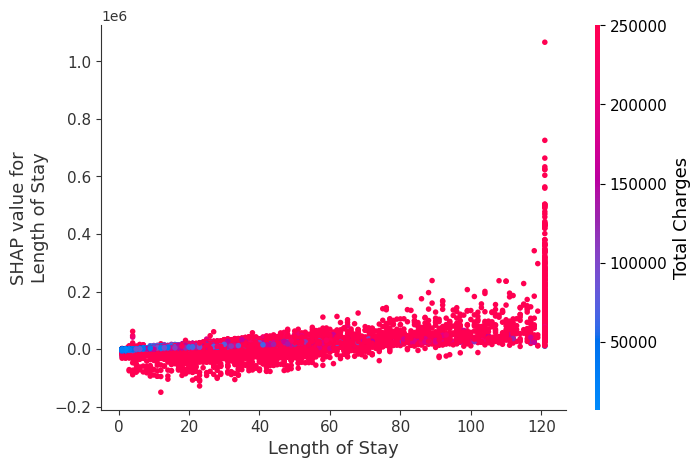

In [ ]:
feature_index = 10
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

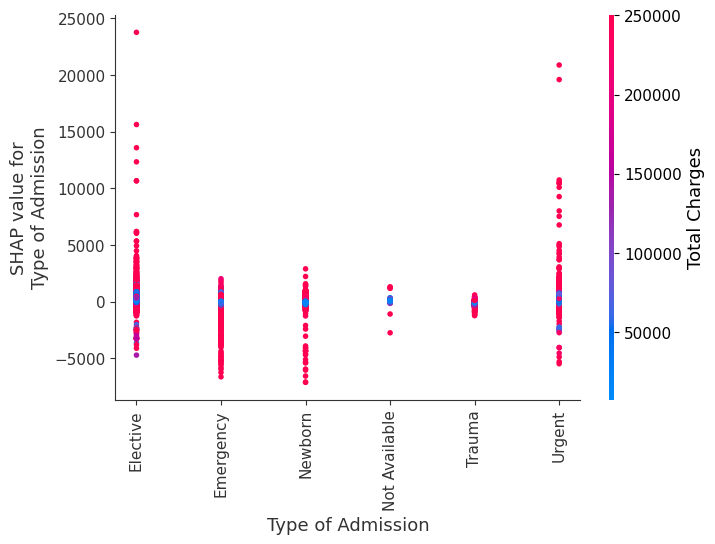

In [ ]:
feature_index = 11
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

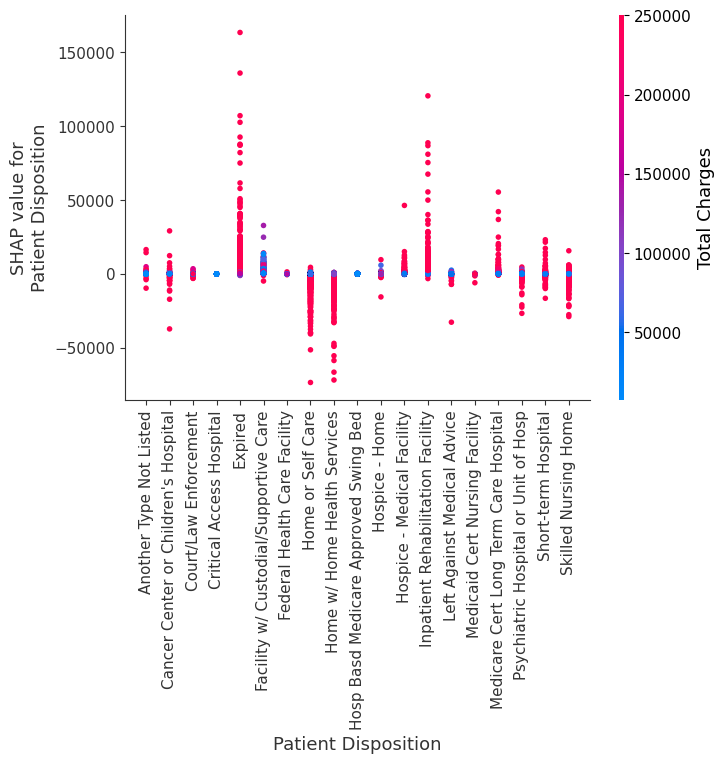

In [ ]:
feature_index = 12
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

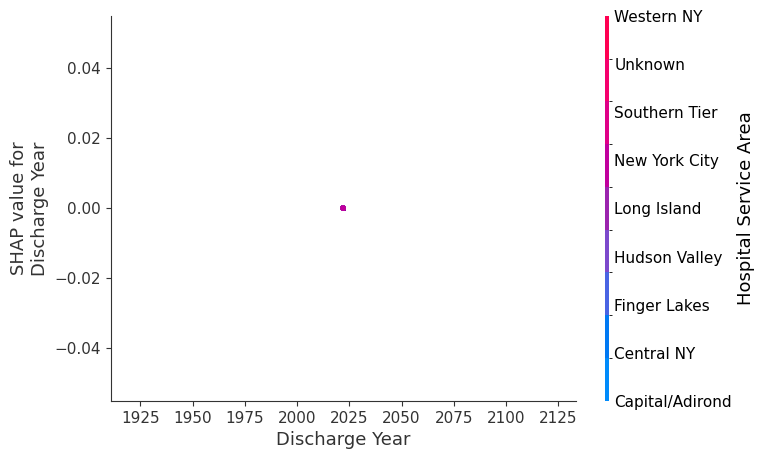

In [ ]:
feature_index = 13
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

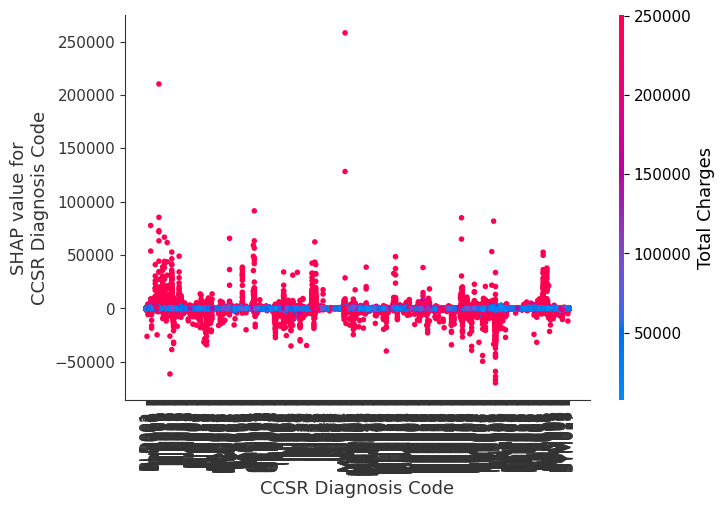

In [ ]:
feature_index = 14
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

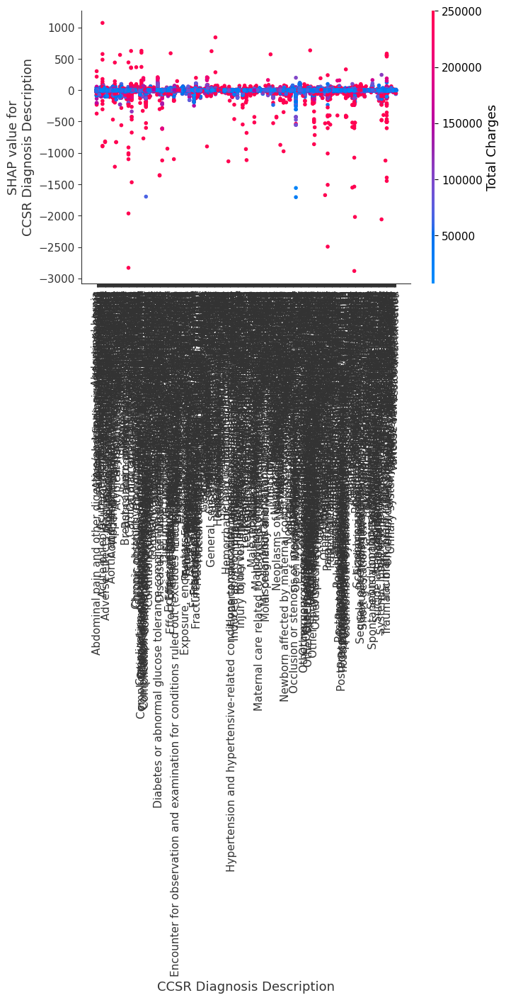

In [ ]:
feature_index = 15
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

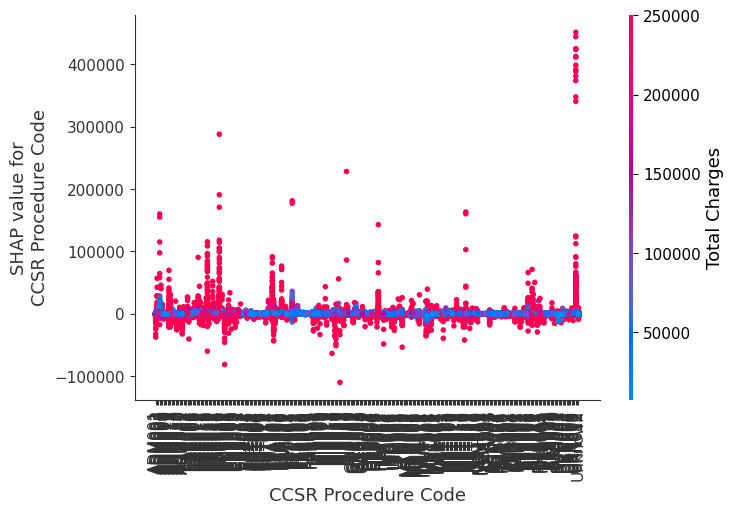

In [ ]:
feature_index = 16
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

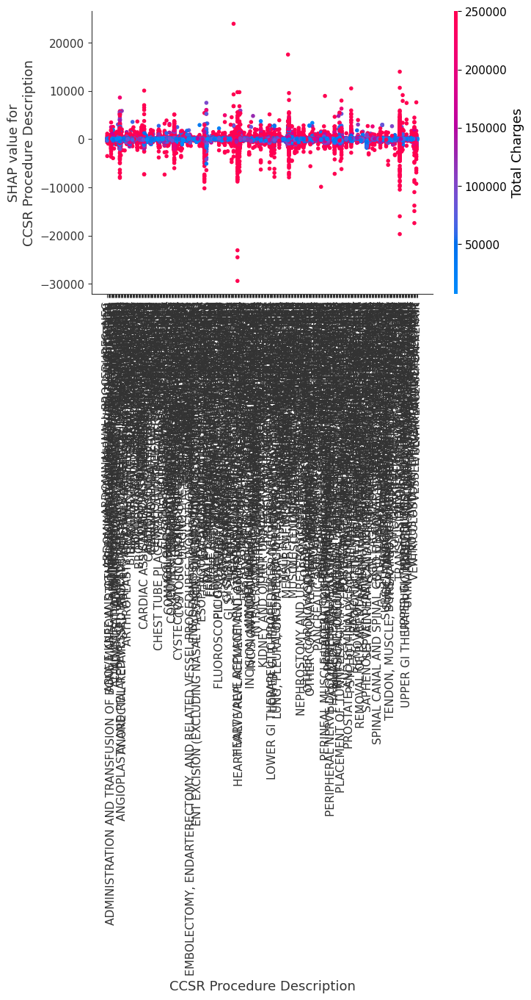

In [ ]:
feature_index = 17
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

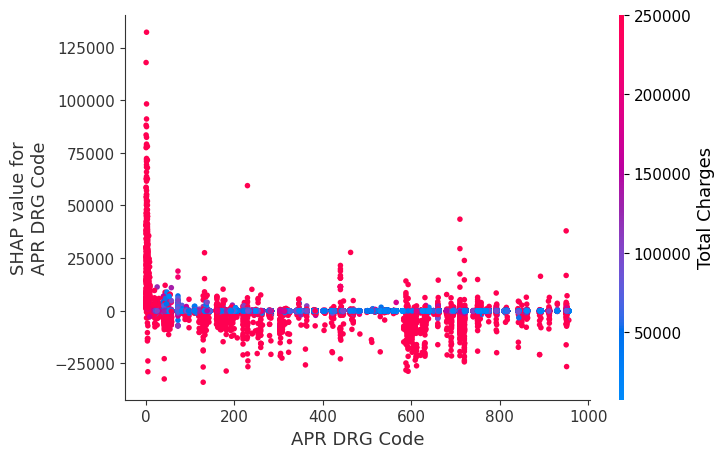

In [ ]:
feature_index = 18
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

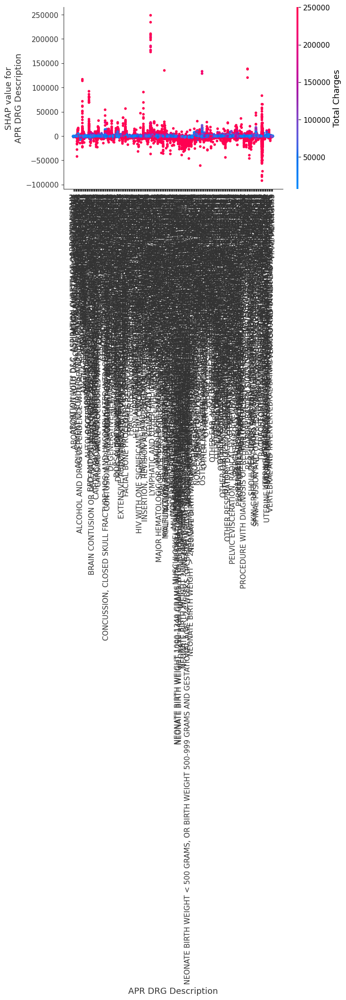

In [ ]:
feature_index = 19
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

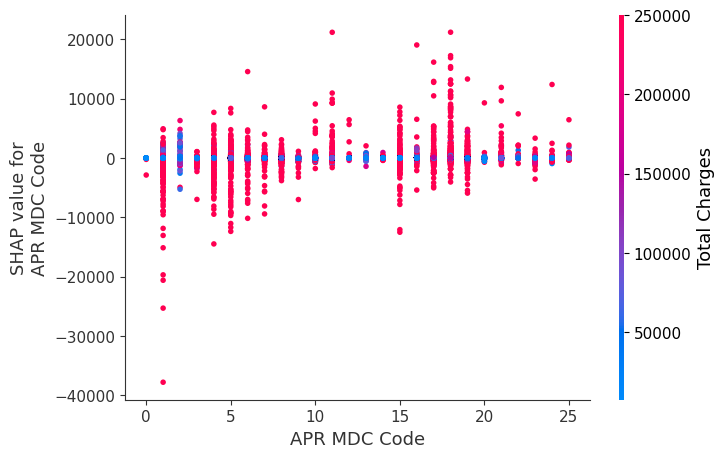

In [ ]:
feature_index = 20
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

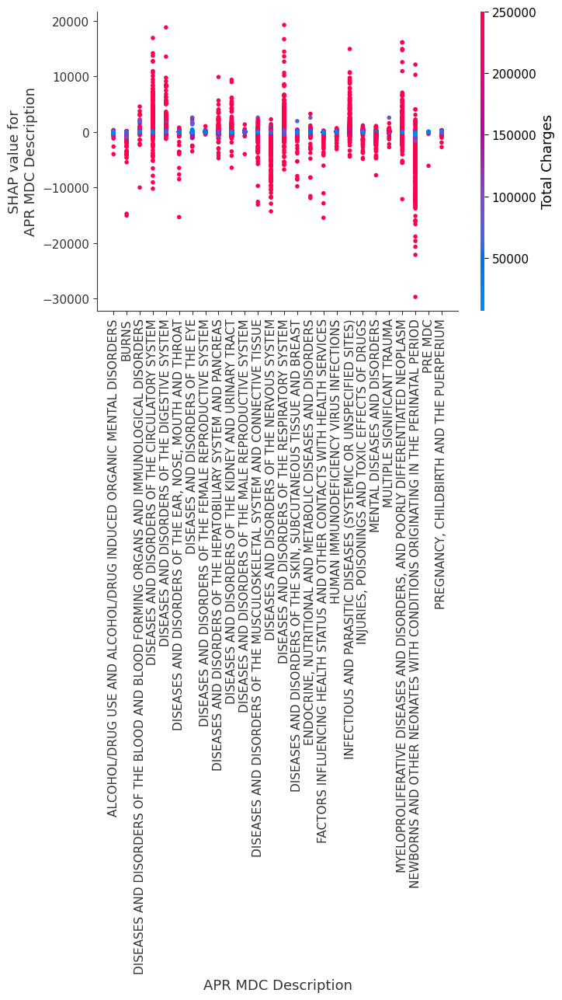

In [ ]:
feature_index = 21
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

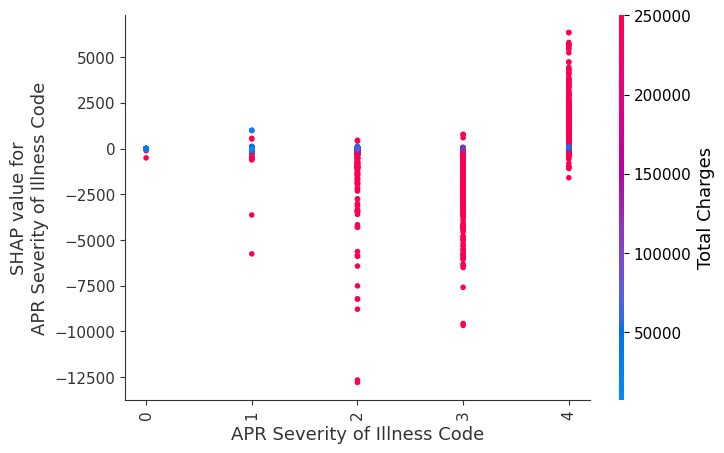

In [ ]:
feature_index = 22
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

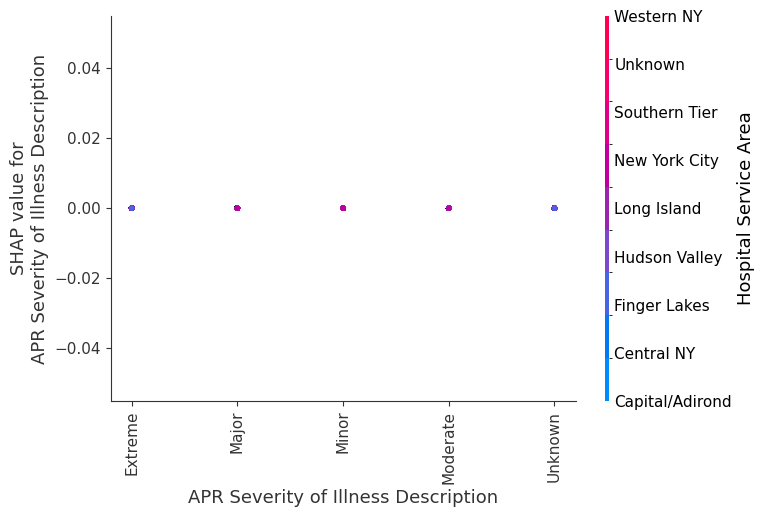

In [ ]:
feature_index = 23
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

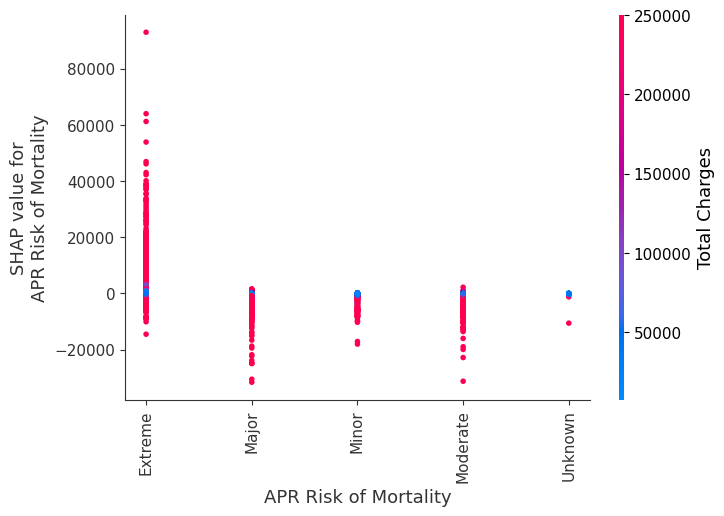

In [ ]:
feature_index = 24
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

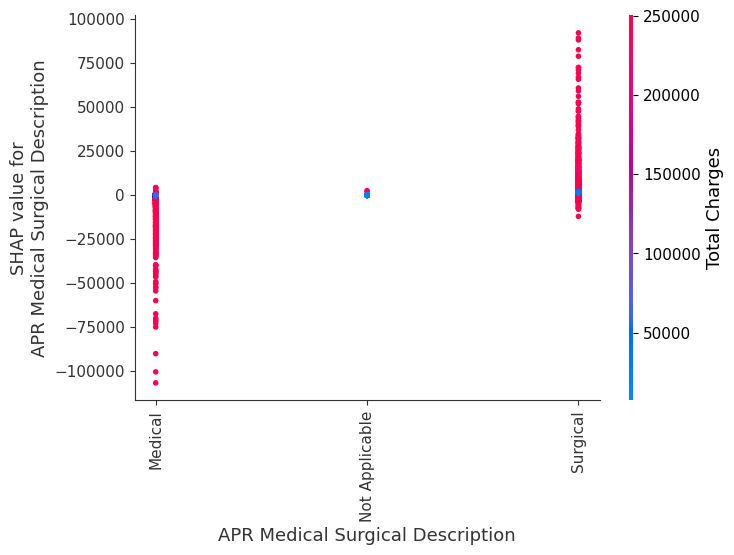

In [ ]:
feature_index = 25
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

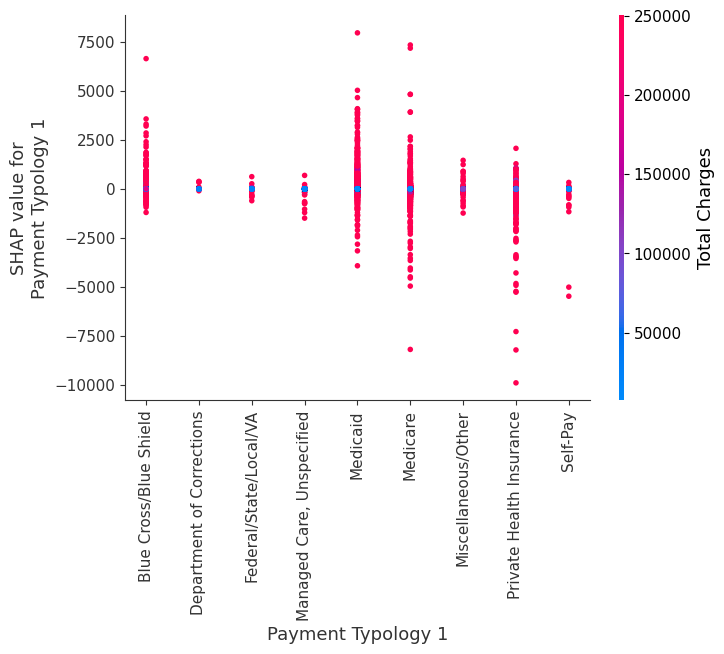

In [ ]:
feature_index = 26
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

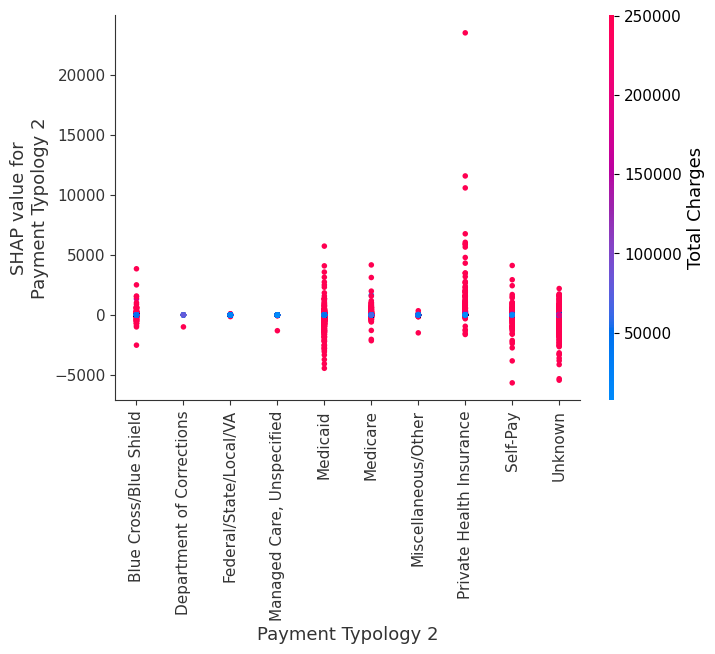

In [ ]:
feature_index = 27
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

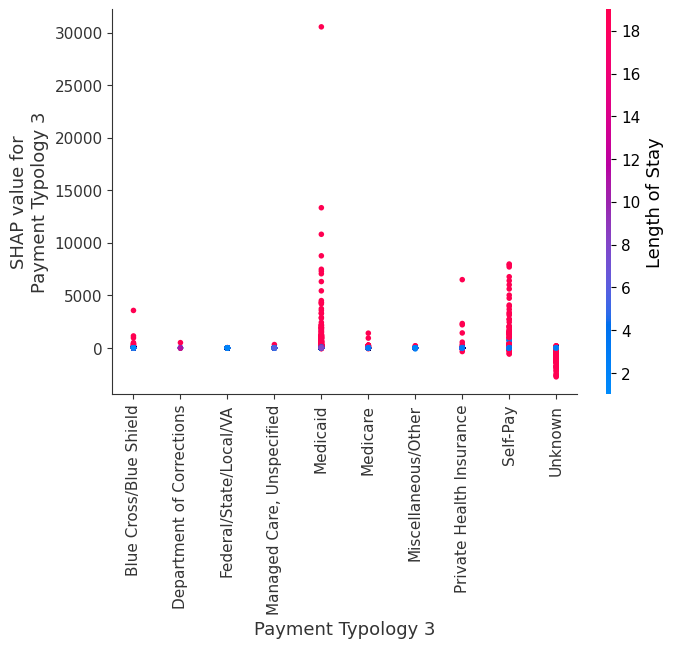

In [ ]:
feature_index = 28
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

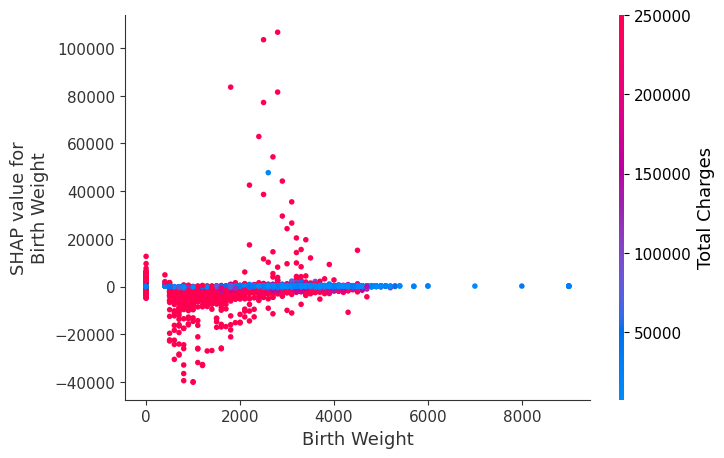

In [ ]:
feature_index = 29
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

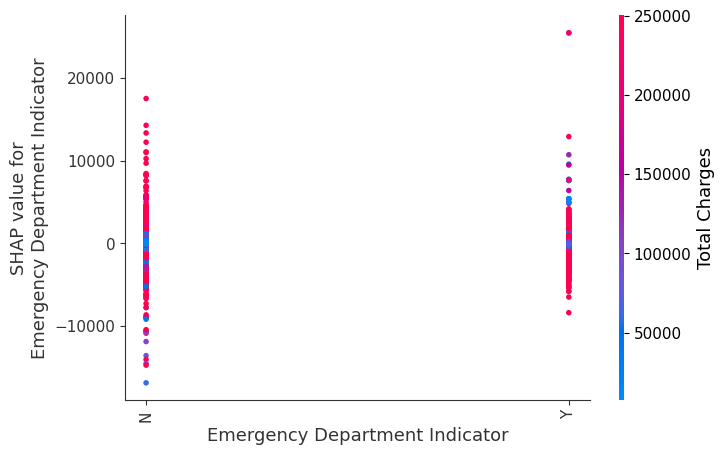

In [ ]:
feature_index = 30
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

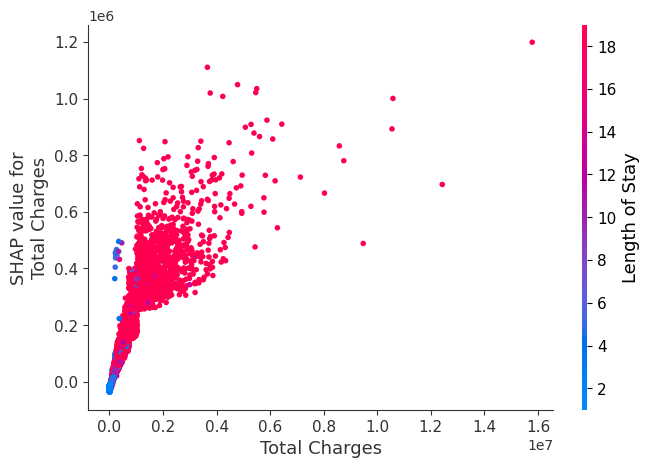

In [ ]:
feature_index = 31
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

In [ ]:
shap.initjs()

instance_index = 0
shap.force_plot(explainer.expected_value, shap_values[instance_index], X_test.iloc[instance_index], feature_names=features)

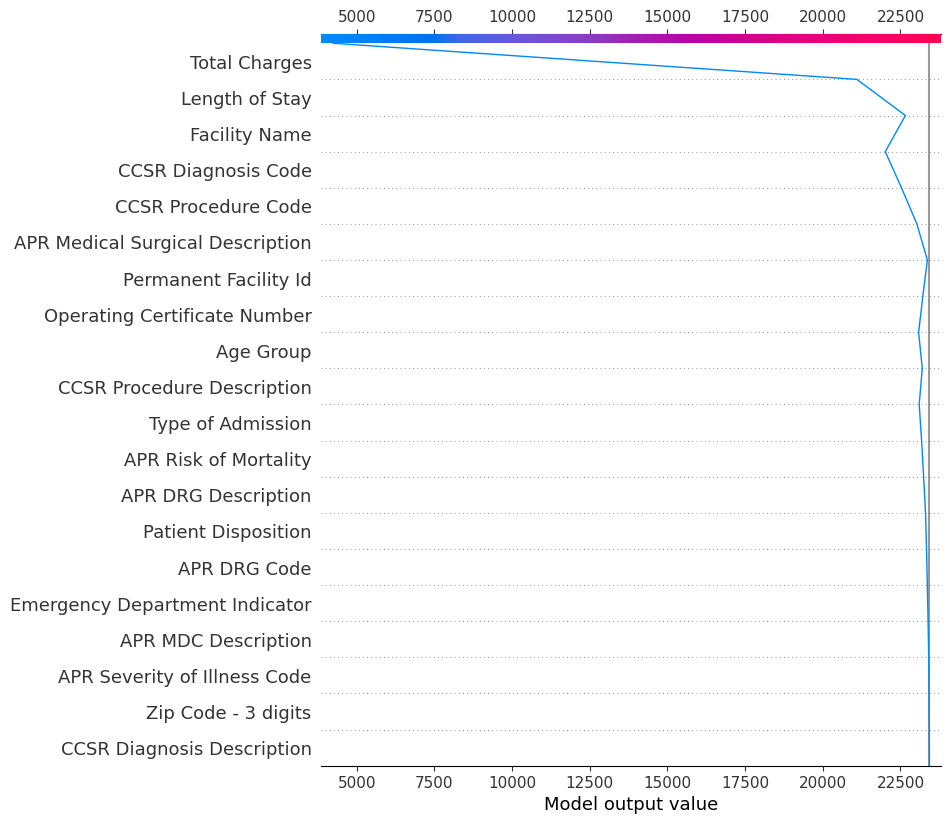

In [ ]:
shap.decision_plot(explainer.expected_value, shap_values[0], feature_names=features)

In [ ]:
# plot the first 100 samples all together
shap.decision_plot(
    explainer.expected_value,
    shap_values[:100],        # a (100, n_features) array
    feature_names=features
)

# SHAP Plots for XGBoost

In [ ]:
!pip install LightGBM
!pip install shap
import joblib

model = joblib.load("/content/drive/MyDrive/DS Project/xgb_model.pkl")

/usr/lib/python3.11/pickle.py:1718: UserWarning: [16:41:33] WARNING: /workspace/src/collective/../data/../common/error_msg.h:82: If you are loading a serialized model (like pickle in Python, RDS in R) or
configuration generated by an older version of XGBoost, please export the model by calling
`Booster.save_model` from that version first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/stable/tutorials/saving_model.html

for more details about differences between saving model and serializing.

  setstate(state)


In [ ]:
import shap

# Explain model predictions using SHAP
explainer = shap.Explainer(model)

In [ ]:
# Save explainer to a file
joblib.dump(explainer, '../models/shap_explainer_xgb.pkl')

# Later: load it back
explainer = joblib.load('../models/shap_explainer_xgb.pkl')

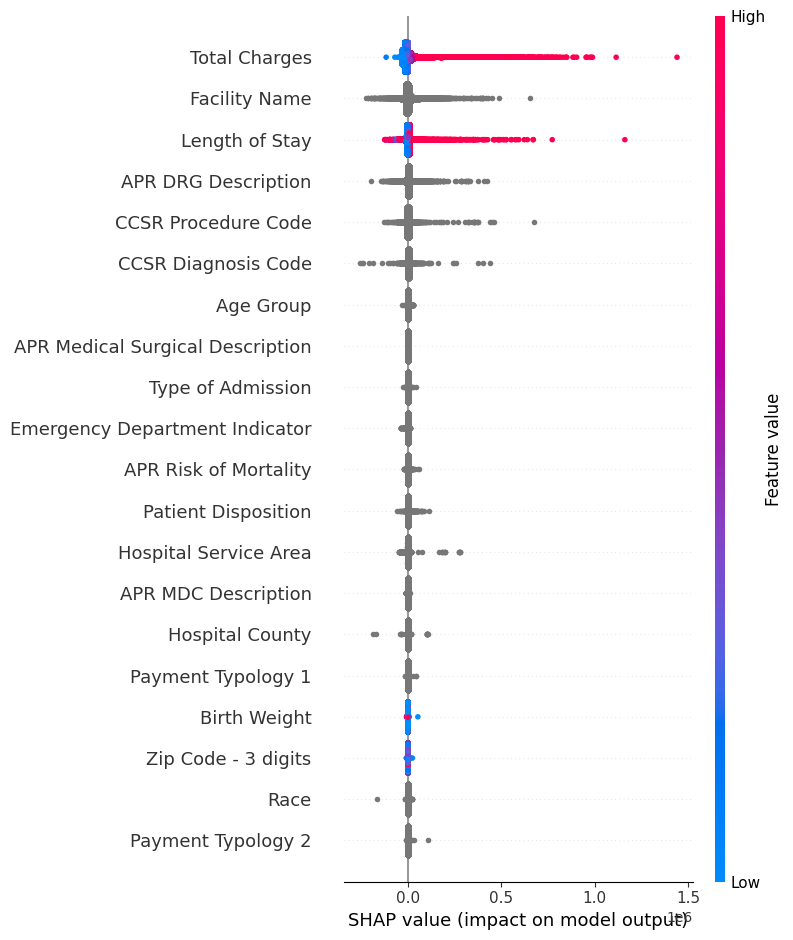

In [ ]:
# Visualize feature importance
shap_values = explainer(X_test)
shap.summary_plot(shap_values, X_test)

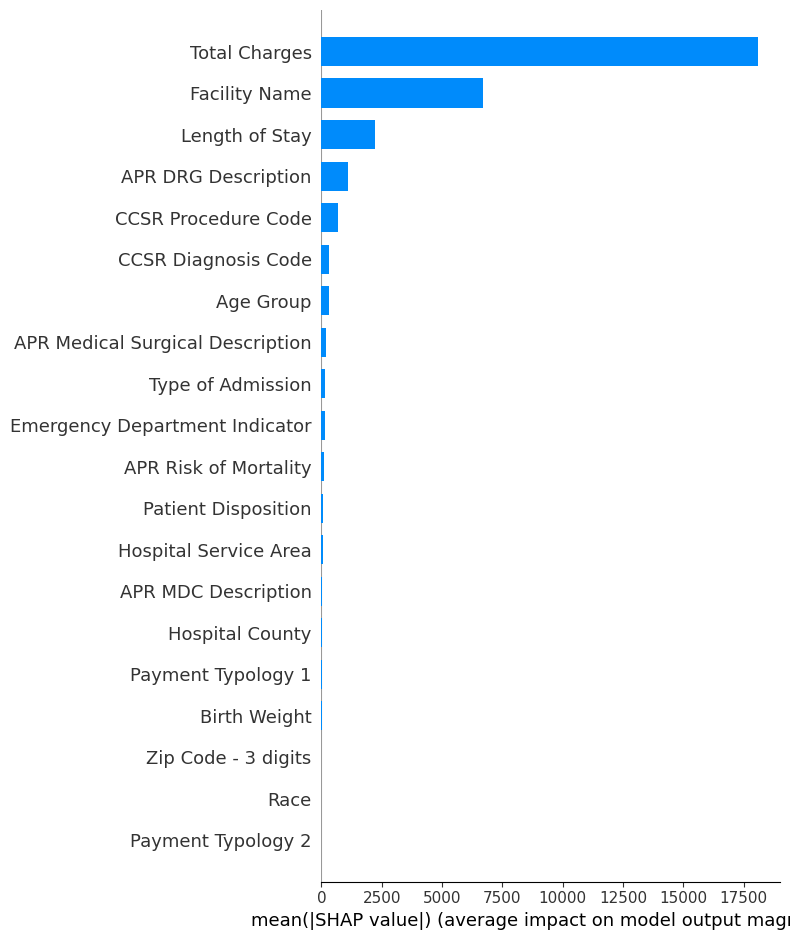

In [ ]:
features = X_test.columns.tolist()
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names=features, plot_type="bar")

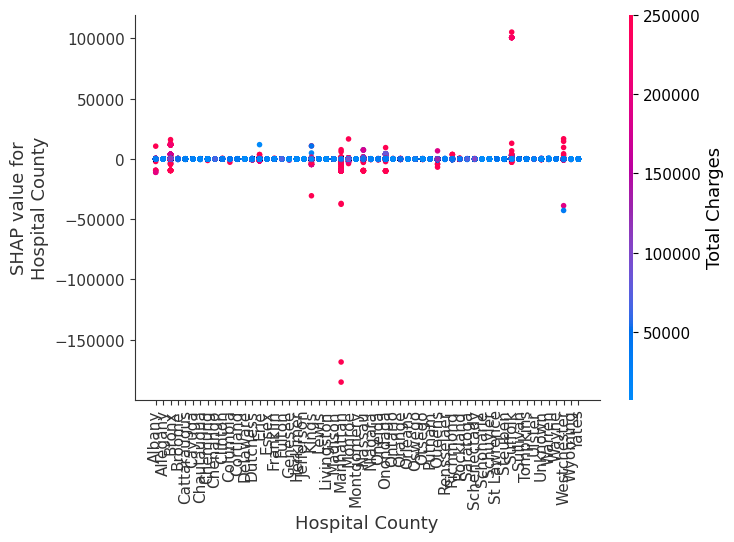

In [ ]:
feature_index = 1
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

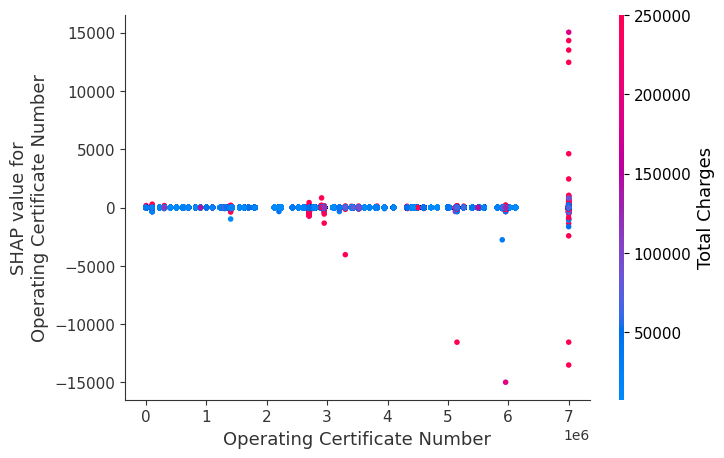

In [ ]:
feature_index = 2
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

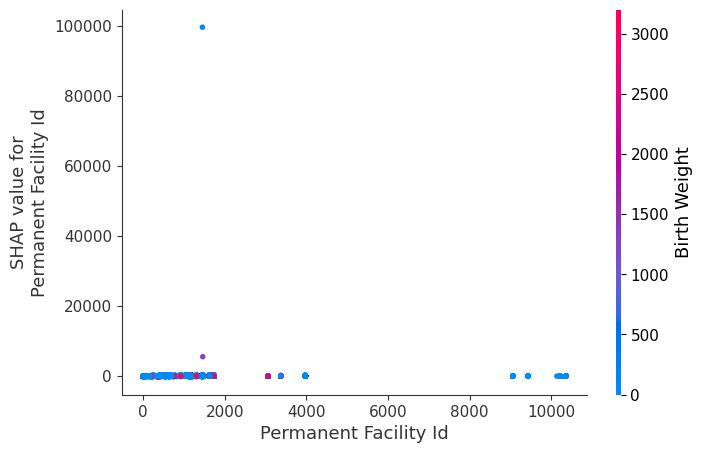

In [ ]:
feature_index = 3
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

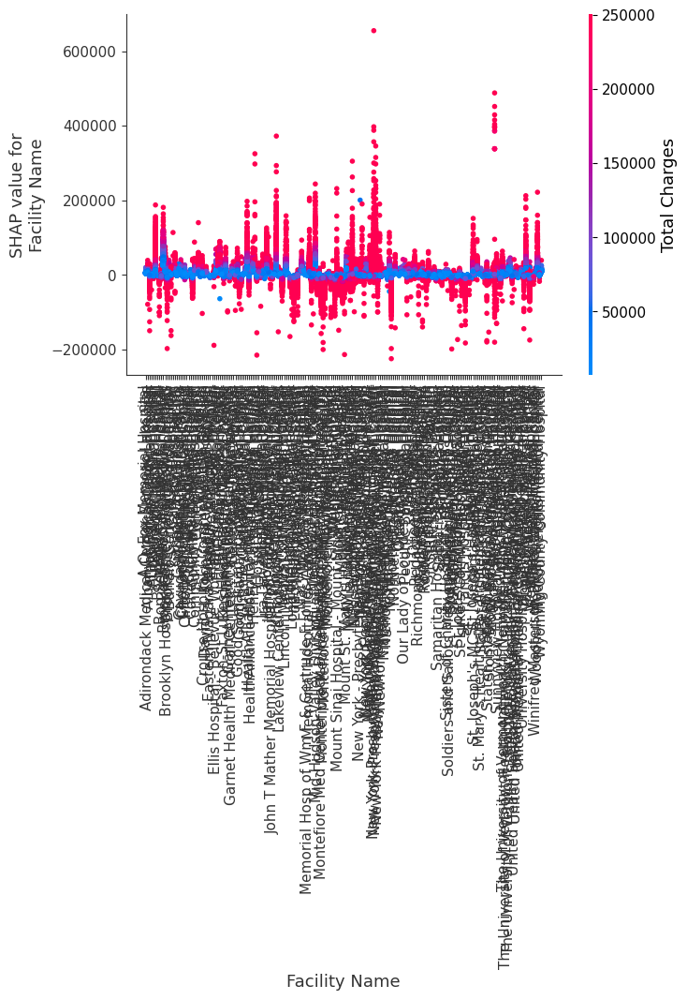

In [ ]:
feature_index = 4
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

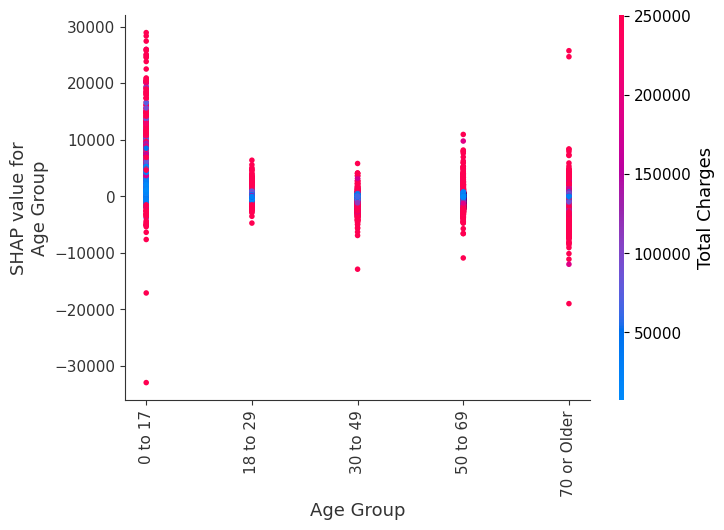

In [ ]:
feature_index = 5
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

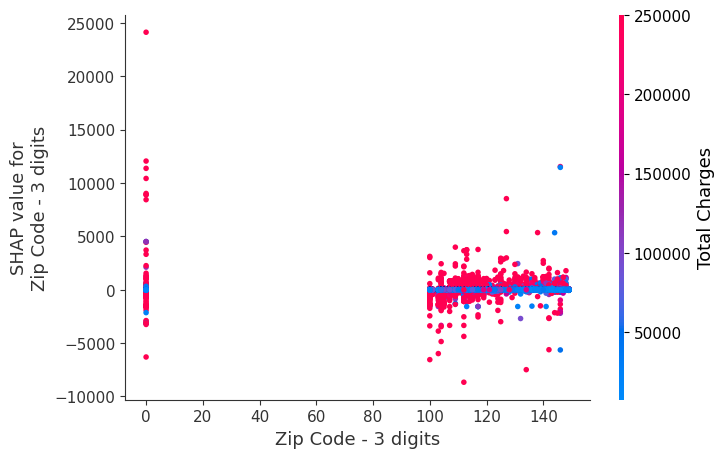

In [ ]:
feature_index = 6
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

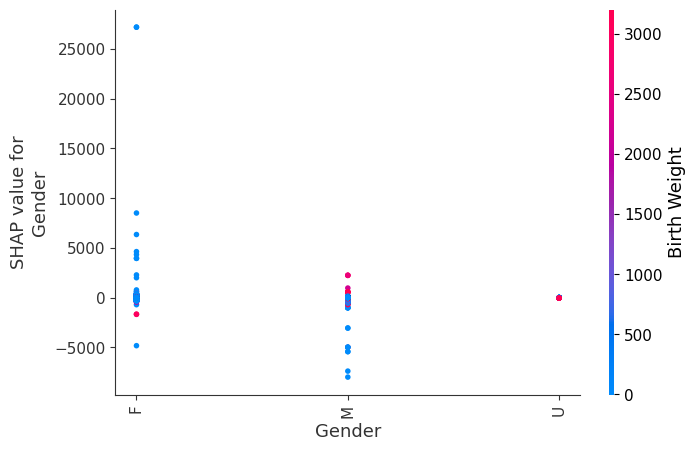

In [ ]:
feature_index = 7
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

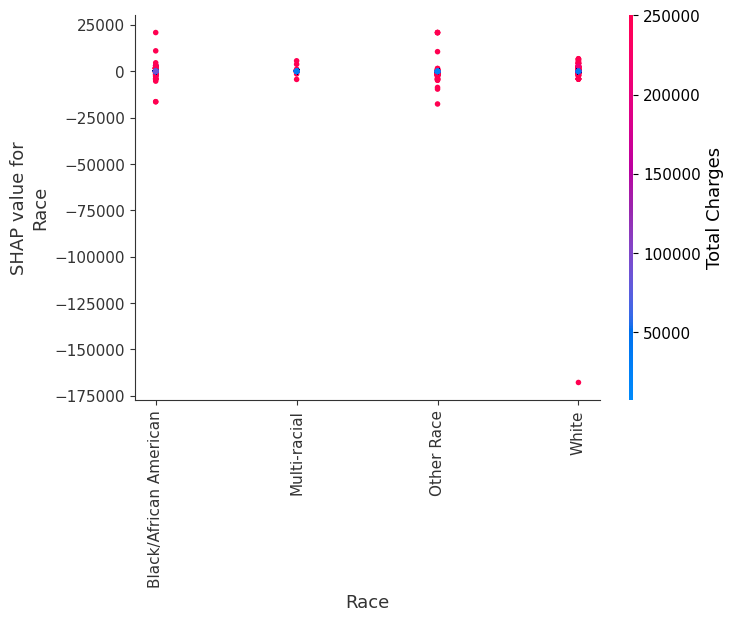

In [ ]:
feature_index = 8
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

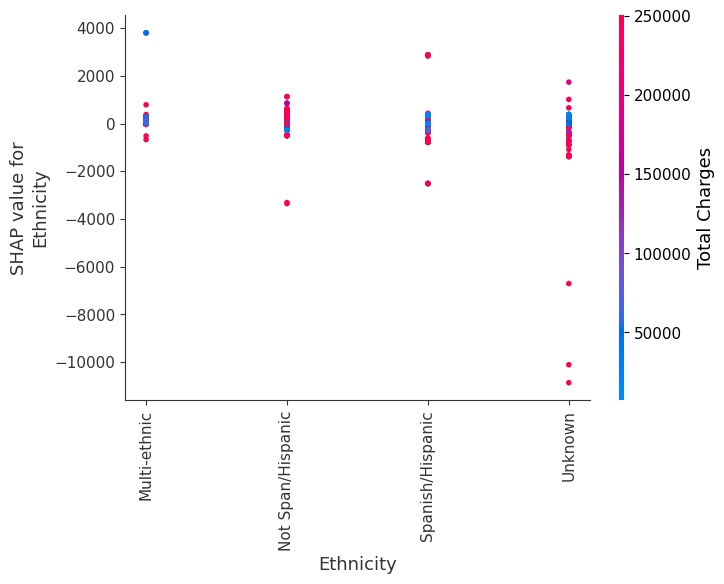

In [ ]:
feature_index = 9
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

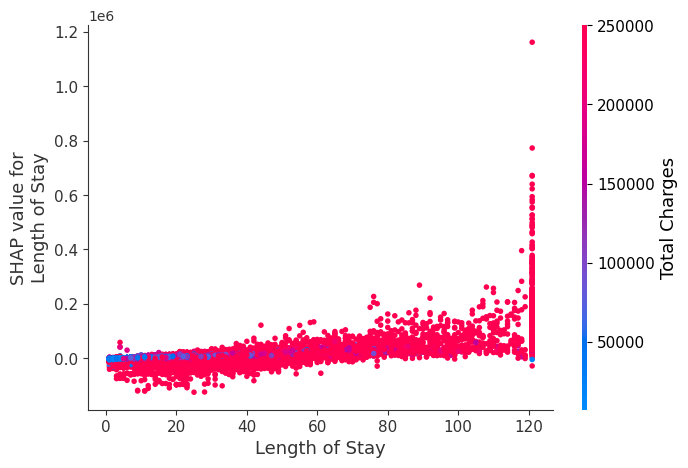

In [ ]:
feature_index = 10
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

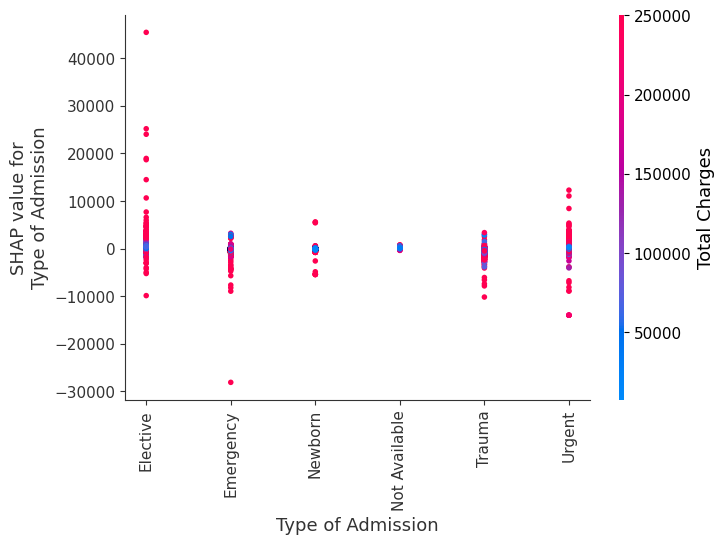

In [ ]:
feature_index = 11
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

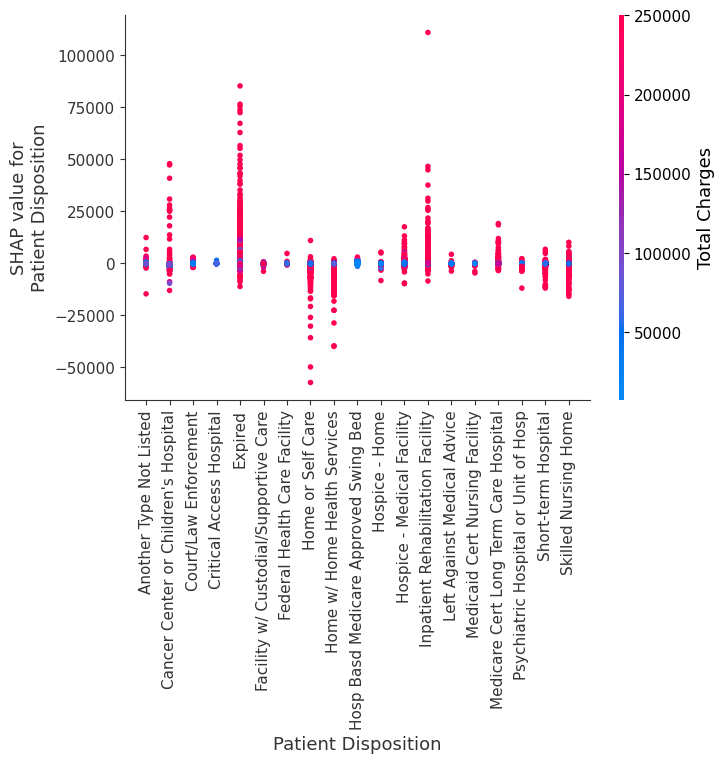

In [ ]:
feature_index = 12
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

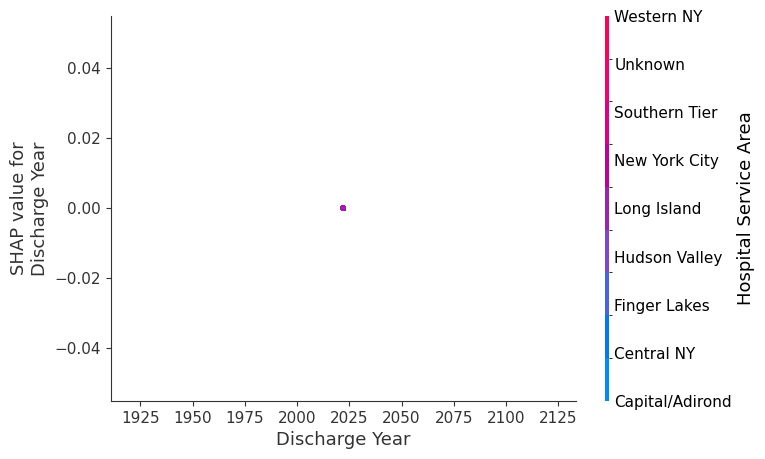

In [ ]:
feature_index = 13
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

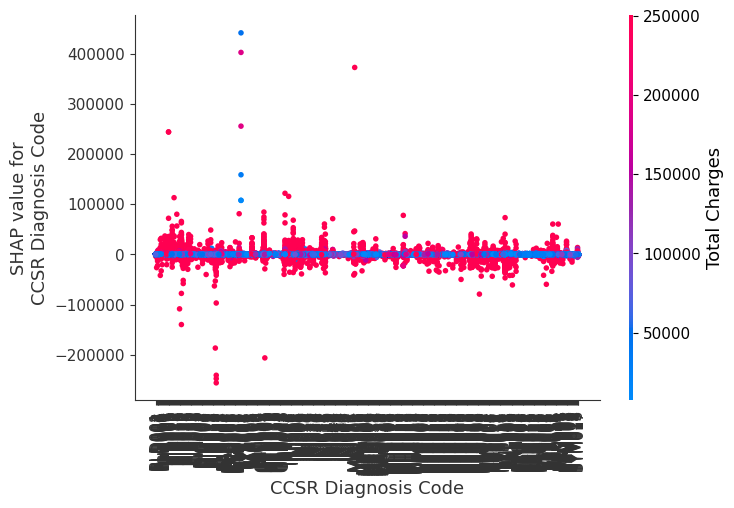

In [ ]:
feature_index = 14
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

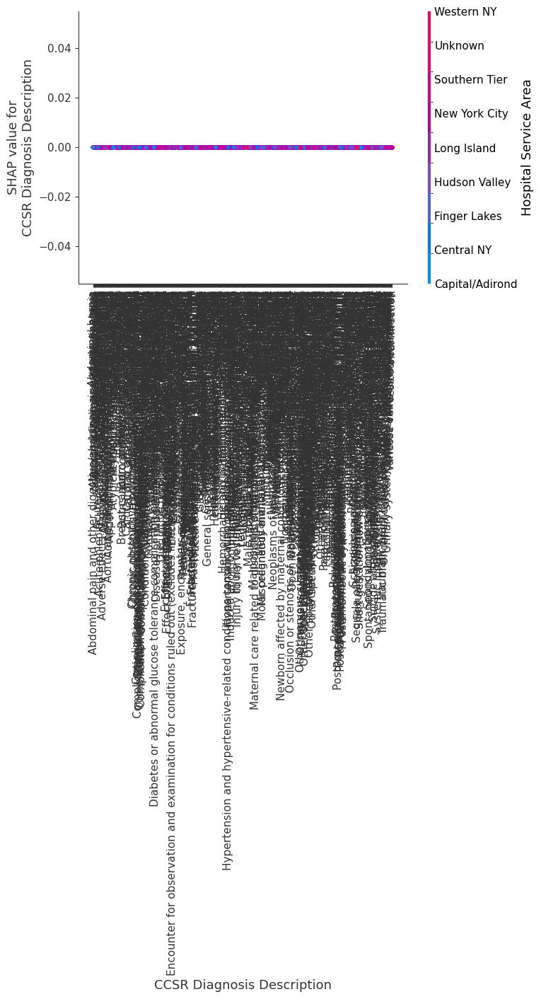

In [ ]:
feature_index = 15
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

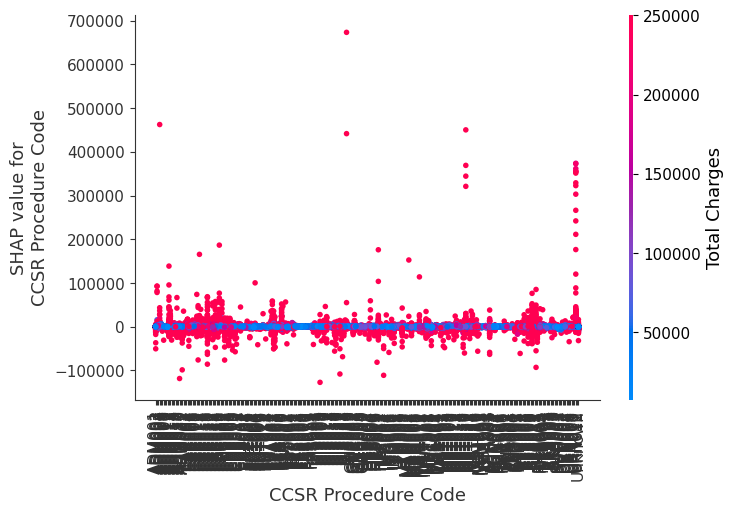

In [ ]:
feature_index = 16
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

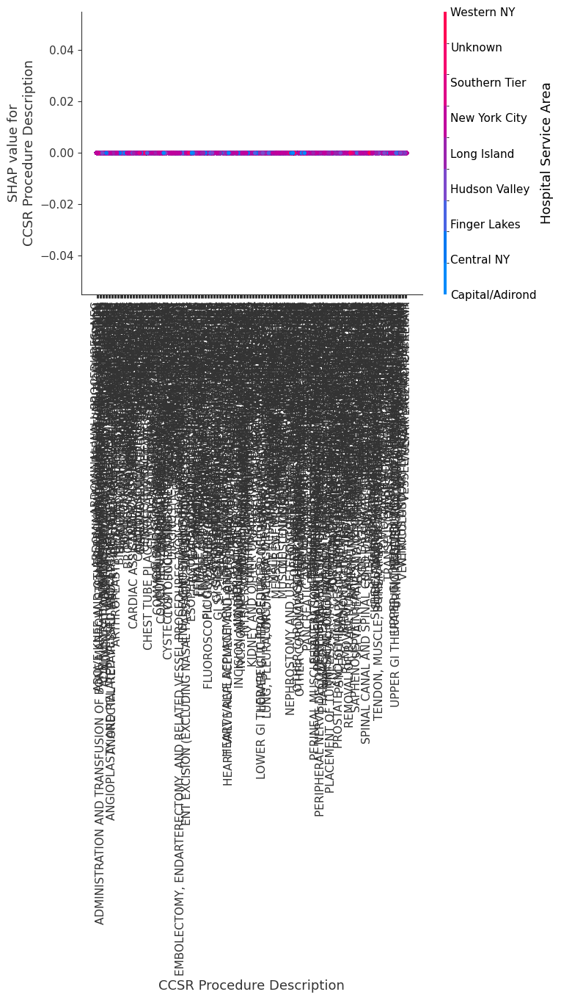

In [ ]:
feature_index = 17
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

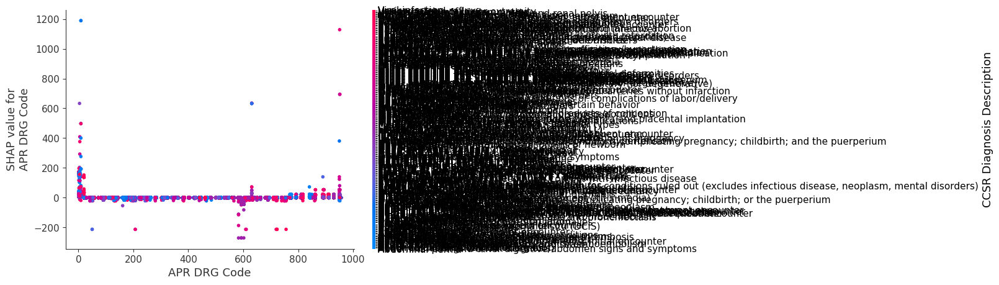

In [ ]:
feature_index = 18
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

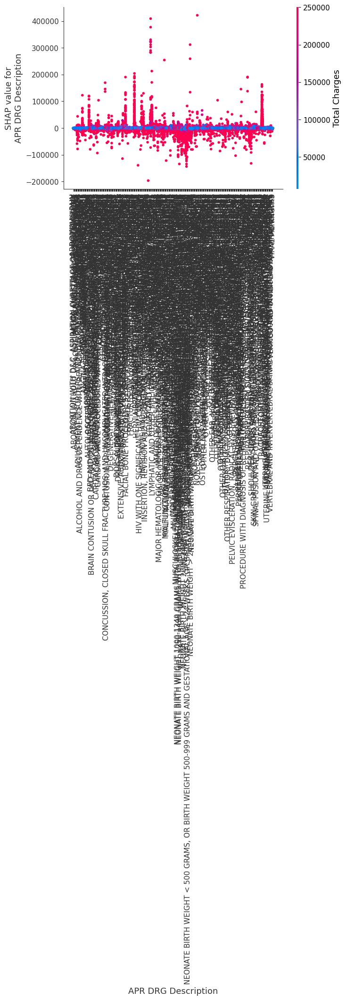

In [ ]:
feature_index = 19
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

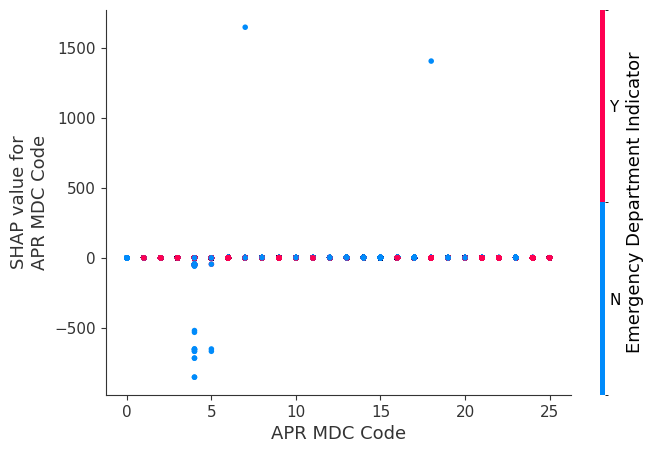

In [ ]:
feature_index = 20
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

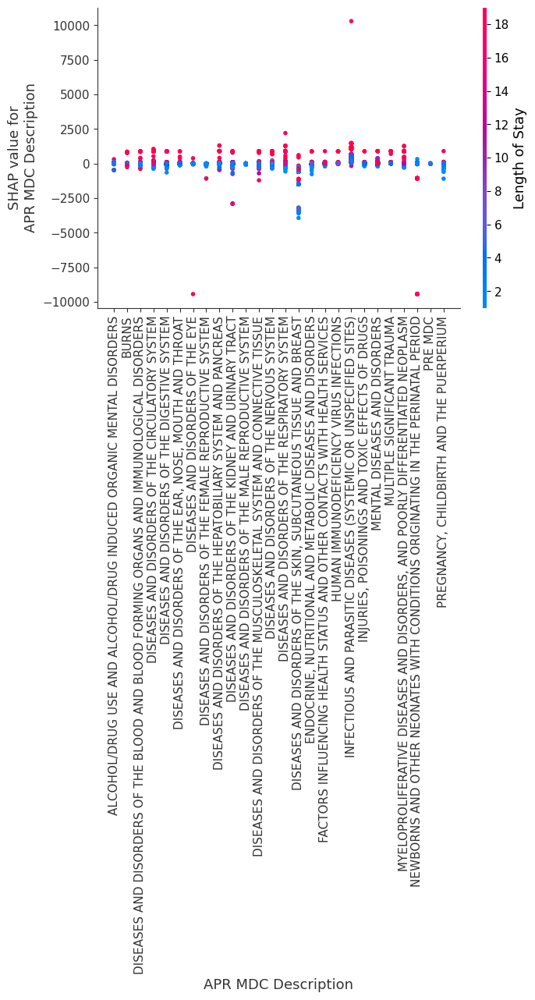

In [ ]:
feature_index = 21
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

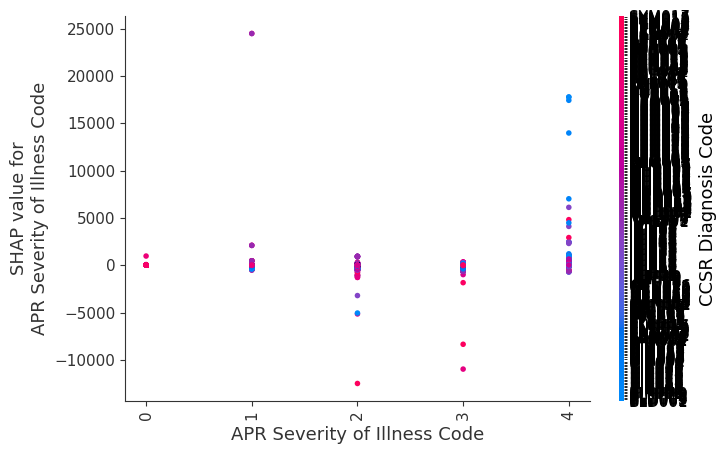

In [ ]:
feature_index = 22
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

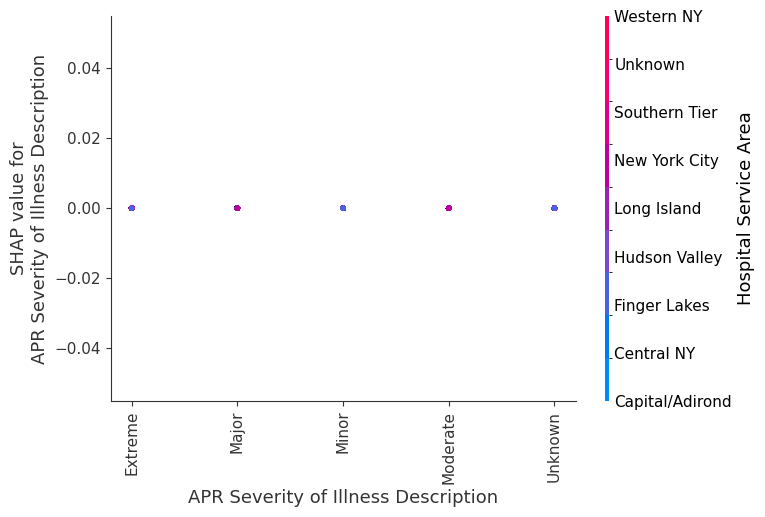

In [ ]:
feature_index = 23
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

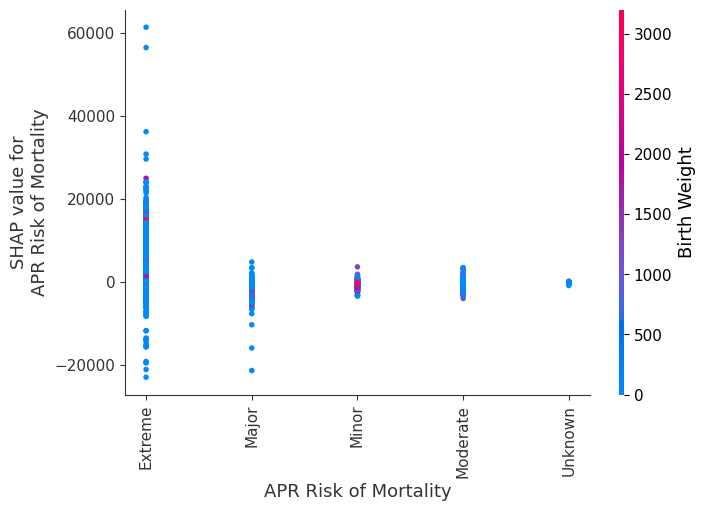

In [ ]:
feature_index = 24
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

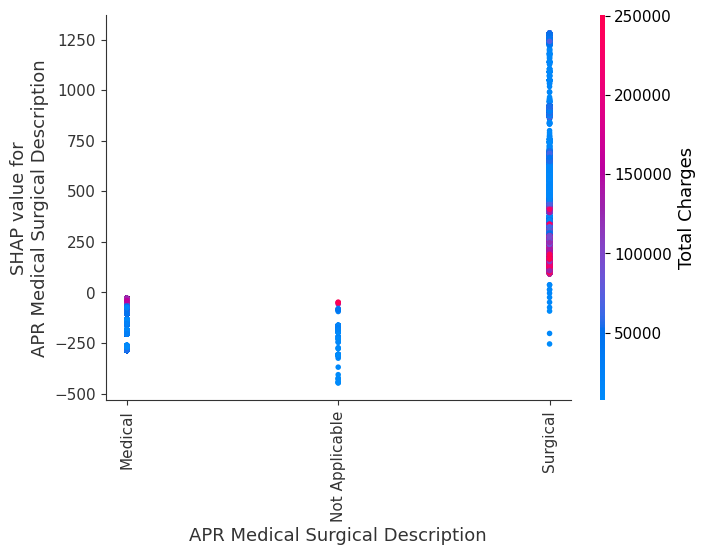

In [ ]:
feature_index = 25
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

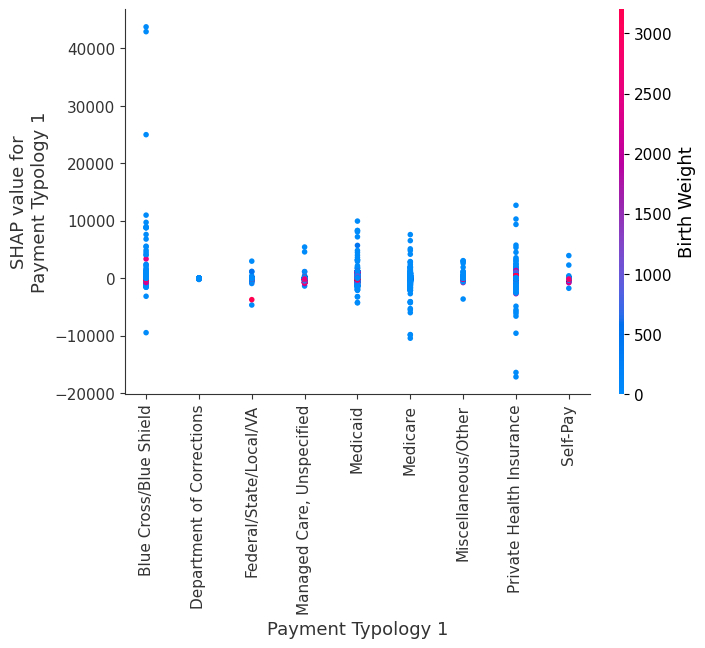

In [ ]:
feature_index = 26
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

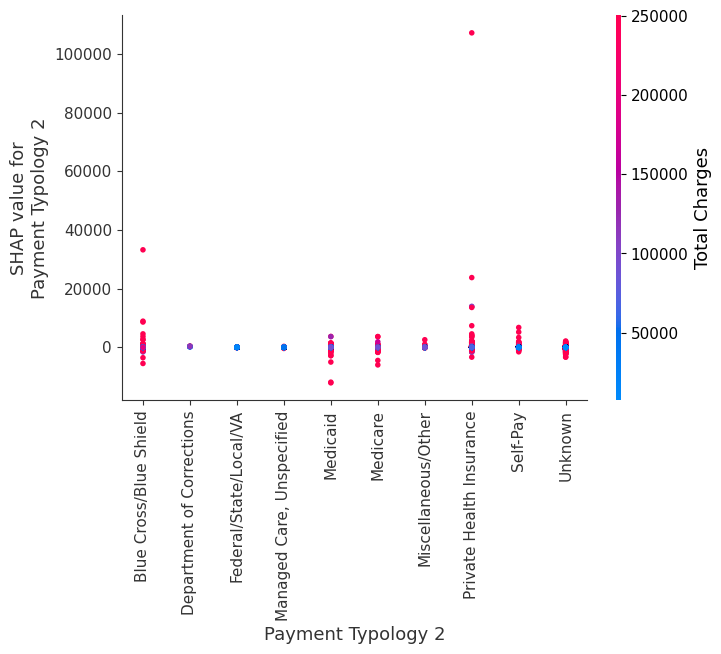

In [ ]:
feature_index = 27
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

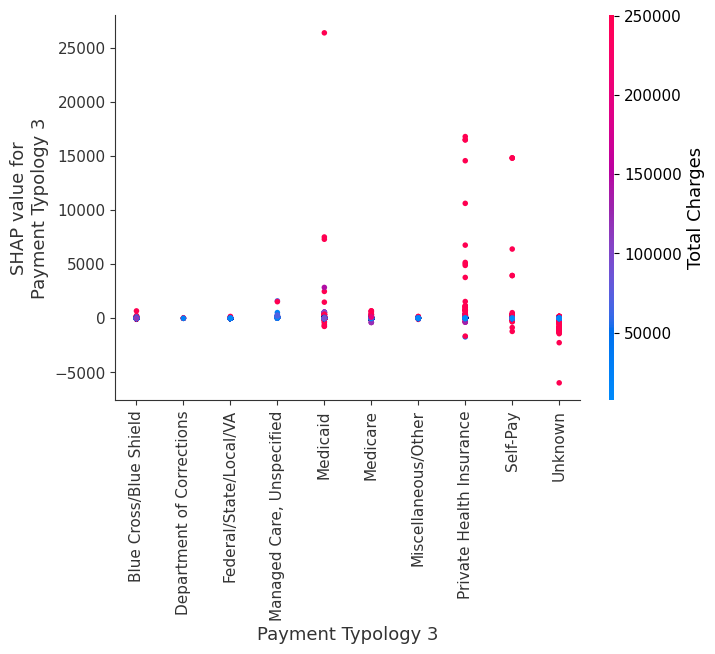

In [ ]:
feature_index = 28
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

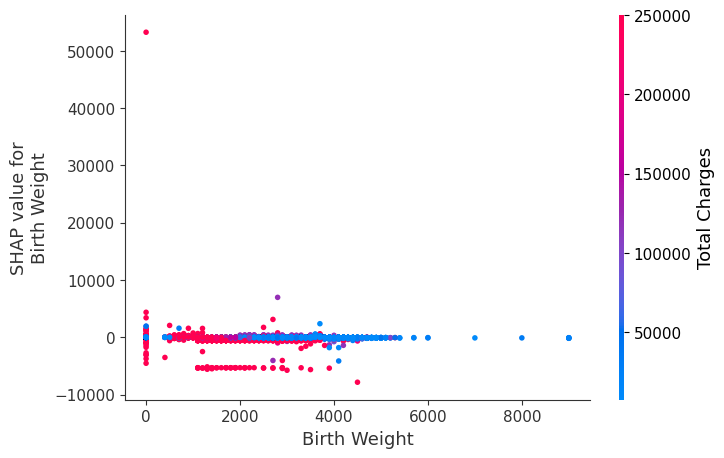

In [ ]:
feature_index = 29
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

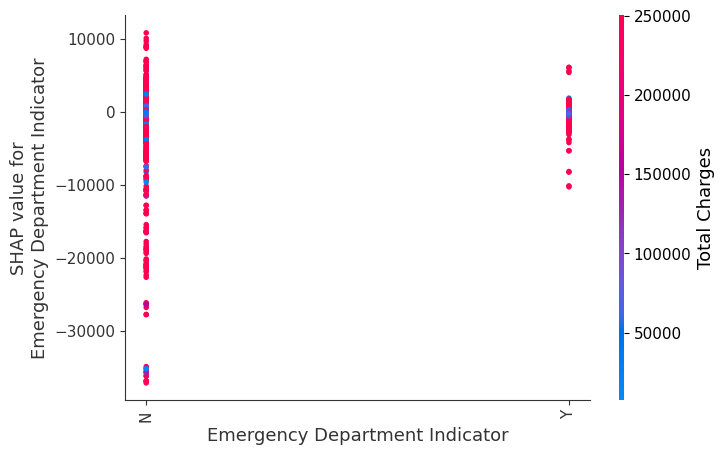

In [ ]:
feature_index = 30
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

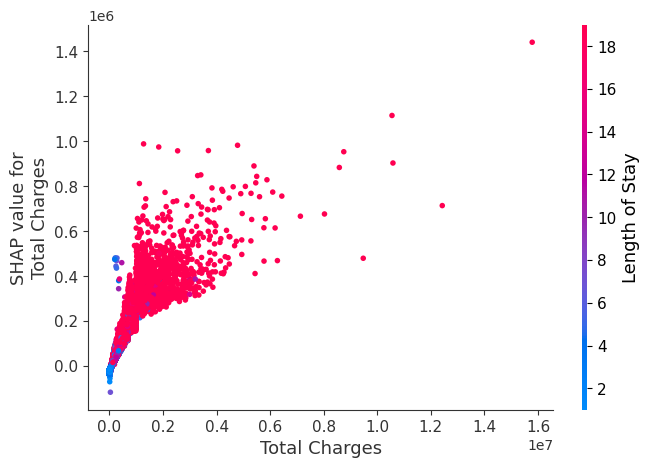

In [ ]:
feature_index = 31
shap.dependence_plot(feature_index, shap_values, X_test, feature_names=features)

In [ ]:
shap.initjs()

instance_index = 0
shap.force_plot(explainer.expected_value, shap_values[instance_index], X_test.iloc[instance_index], feature_names=features)

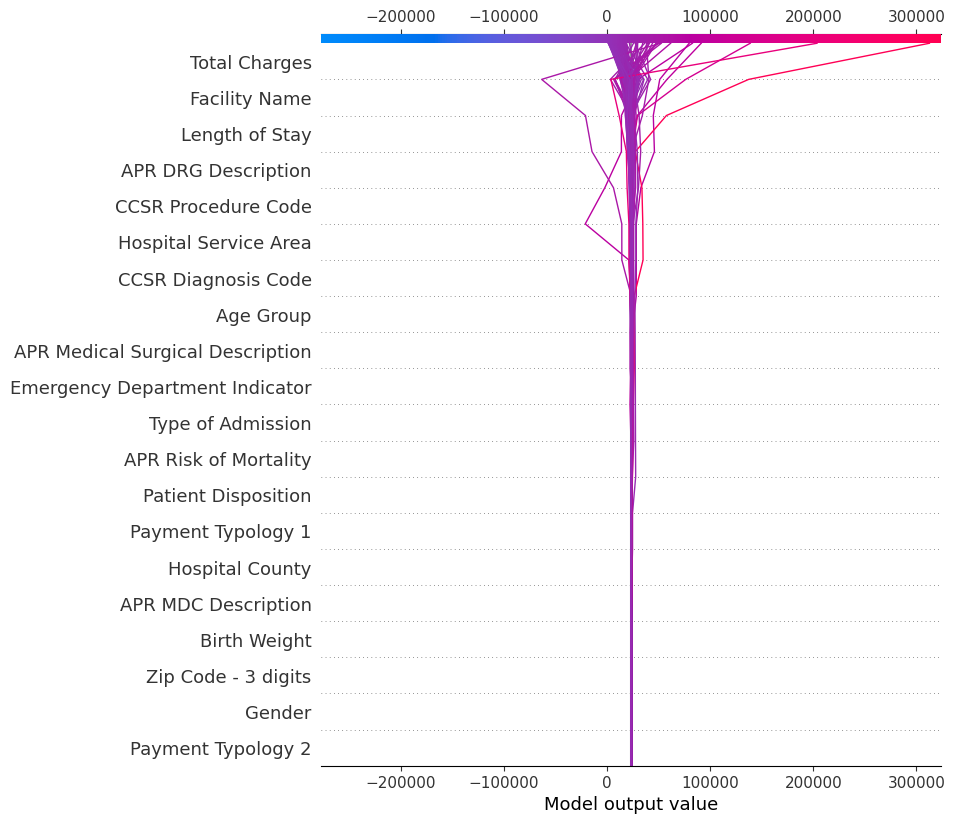

In [ ]:
# plot the first 100 samples all together
shap.decision_plot(
    explainer.expected_value,
    shap_values[:100],        # a (100, n_features) array
    feature_names=features
)

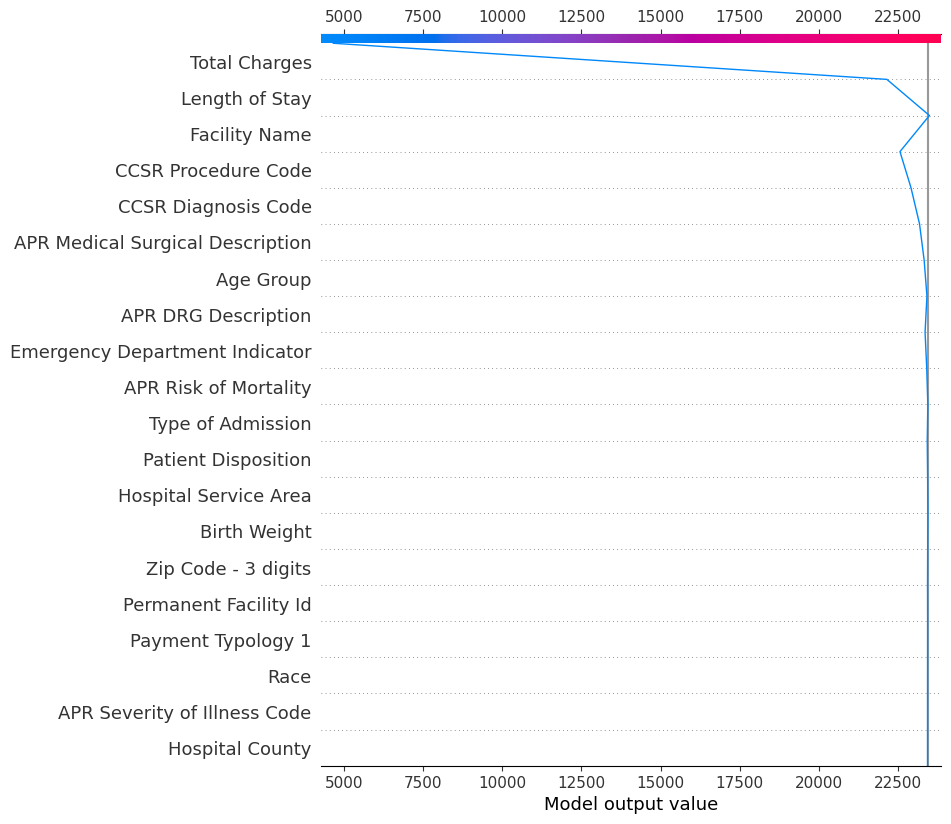

In [ ]:
shap.decision_plot(explainer.expected_value, shap_values[0], feature_names=features)

# LIME Plots for LightGBM and XGBoost

In [ ]:
!pip install lime
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split


data_temp = data.copy()

for col in data_temp.select_dtypes(include='category').columns:
    le = LabelEncoder()
    data_temp[col] = le.fit_transform(data_temp[col].astype(str))

X = data_temp.drop(columns=['Total Costs', ])
y = data_temp['Total Costs']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# LIME explainer
explainer = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    mode='regression'
)

# test sample
query_instance = X_test.iloc[0]

# get LIME explanations
exp = explainer.explain_instance(
    data_row=query_instance.values,
    predict_fn=model.predict,
    num_features=10
)

  Using cached lime-0.2.0.1-py3-none-any.whl


In [ ]:
exp.show_in_notebook(show_table=True)

print("Prediction:", model.predict([query_instance.values])[0])
print("LIME Explanation:")
print(exp.as_list())

Prediction: 4661.2246
LIME Explanation:
[('Total Charges <= 20435.94', -40461.68762829588), ('Birth Weight <= -1.00', 5530.065186305056), ('Facility Name <= 66.00', 4052.9571935722024), ('2.00 < Race <= 3.00', -3771.5675969547133), ('81.00 < CCSR Diagnosis Code <= 192.00', 3715.7388598599887), ('Operating Certificate Number <= 2951001.00', -3600.8280815243534), ('5.00 < APR MDC Description <= 13.00', 3180.1749241380935), ('APR Severity of Illness Code <= 1.00', -2615.9567023933805), ('1.00 < APR Severity of Illness Description <= 2.00', 2567.5989091274605), ('Hospital Service Area > 5.00', -2475.1910418777734)]
